In [1]:
# ==============================================================================
# 1 IMPORT LIBRARIES & GPU SETUP
# ==============================================================================
import os
import warnings
import logging

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
warnings.filterwarnings('ignore')

import absl.logging
absl.logging.set_verbosity(absl.logging.FATAL)

import gc
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf

tf.get_logger().setLevel(logging.FATAL)
tf.autograph.set_verbosity(3)

# ------------------------------------------------------------------------------
# INISIALISASI PATH LOKAL (V2)
# ------------------------------------------------------------------------------
DATASET_PATH = r"C:\Users\DELL\OneDrive\Documents\TA\Test env terpisah\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Dataset"
WORKING_PATH = r"C:\Users\DELL\OneDrive\Documents\TA\Test env terpisah\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output"

if not os.path.exists(WORKING_PATH):
    os.makedirs(WORKING_PATH)

print("=" * 80)
print("SETUP KOMPUTASI (SINGLE DEDICATED GPU) & LINGKUNGAN BERSIH")
print("=" * 80)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            
        strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
        print(f"[INFO] Deteksi {len(gpus)} GPU(s). Memory Growth ON.")
        print(f"[INFO] Path Output: {WORKING_PATH}")
        print("[INFO] Strategi Distribusi: Single GPU (Local).")
    except RuntimeError as e:
        print(f"[ERROR] Inisialisasi GPU gagal: {e}")
else:
    print("[WARNING] GPU tidak terdeteksi. Eksekusi jatuh ke CPU.")

SETUP KOMPUTASI (SINGLE DEDICATED GPU) & LINGKUNGAN BERSIH
[INFO] Deteksi 1 GPU(s). Memory Growth ON.
[INFO] Path Output: C:\Users\DELL\OneDrive\Documents\TA\Test env terpisah\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output
[INFO] Strategi Distribusi: Single GPU (Local).


In [2]:
# ==============================================================================
# 2.1 LOAD DATASET
# ==============================================================================
print("[INFO] Memetakan lokasi file dataset lokal...")

file_paths = {}
for dirname, _, filenames in os.walk(DATASET_PATH):
    for filename in filenames:
        if filename.endswith('.csv'):
            fname_lower = filename.lower()
            if 'liver' in fname_lower:
                file_paths['Liver'] = os.path.join(dirname, filename)
            elif 'prostate' in fname_lower:
                file_paths['Prostate'] = os.path.join(dirname, filename)
            elif 'thyroid' in fname_lower:
                file_paths['Thyroid'] = os.path.join(dirname, filename)
            elif 'lung' in fname_lower:
                file_paths['Lung'] = os.path.join(dirname, filename)

if len(file_paths) < 4:
    raise FileNotFoundError(f"[ERROR] Dataset tidak lengkap di path: {DATASET_PATH}")
else:
    print("[INFO] Semua file berhasil dipetakan:")
    for key, path in file_paths.items():
        print(f"       - {key}: {path}")

print("\n[INFO] Memuat dataset CSV ke memori...")

df_liver = pd.read_csv(file_paths['Liver'])
df_prostate = pd.read_csv(file_paths['Prostate'])
df_thyroid = pd.read_csv(file_paths['Thyroid'])
df_lung = pd.read_csv(file_paths['Lung'])

print("\n" + "=" * 80)
print("INFORMASI DIMENSI DATASET")
print("=" * 80)
print(f"[DATA] Liver RNA    : {df_liver.shape[0]:,} sampel | {df_liver.shape[1]-1:,} fitur")
print(f"[DATA] Prostate RNA : {df_prostate.shape[0]:,} sampel | {df_prostate.shape[1]-1:,} fitur")
print(f"[DATA] Thyroid RNA  : {df_thyroid.shape[0]:,} sampel | {df_thyroid.shape[1]-1:,} fitur")
print(f"[DATA] Lung RNA     : {df_lung.shape[0]:,} sampel | {df_lung.shape[1]-1:,} fitur")

gc.collect()

[INFO] Memetakan lokasi file dataset lokal...
[INFO] Semua file berhasil dipetakan:
       - Liver: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Dataset\Liver RNA Data.csv
       - Lung: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Dataset\Lung RNA Data.csv
       - Prostate: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Dataset\Prostate RNA Data.csv
       - Thyroid: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Dataset\Thyroid RNA Data.csv

[INFO] Memuat dataset CSV ke memori...

INFORMASI DIMENSI DATASET
[DATA] Liver RNA    : 422 sampel | 20,530 fitur
[DATA] Prostate RNA : 550 sampel | 20,530 fitur
[DATA] Thyroid RNA  : 572 sampel | 20,530 fitur
[DATA] Lung RNA     : 1,099 sampel | 20,530 fitur


0

In [3]:
# ==============================================================================
# 2.2 PREVIEW DATASET
# ==============================================================================
print("\n" + "=" * 80)
print("[INFO] Menampilkan 5 baris pertama dari representasi tiap dataset:")
print("=" * 80)
print("Liver RNA Data:")
display(df_liver.head())
print("Prostate RNA Data")
display(df_prostate.head())
print("Thyroid RNA  Data")
display(df_thyroid.head())
print("Lung RNA  Data")
display(df_lung.head())


print("\n" + "=" * 80)
print("[INFO] Menampilkan struktur 5 kolom pertama dan 5 kolom terakhir:")
print("=" * 80)
# Menampilkan cuplikan nama fitur (gen)
print("Liver RNA Data")
display(df_liver.iloc[:, np.r_[0:5, -5:0]].head())
print("Prostate RNA Data")
display(df_prostate.iloc[:, np.r_[0:5, -5:0]].head())
print("Thyroid RNA  Data")
display(df_thyroid.iloc[:, np.r_[0:5, -5:0]].head())
print("Lung RNA  Data")
display(df_lung.iloc[:, np.r_[0:5, -5:0]].head())


[INFO] Menampilkan 5 baris pertama dari representasi tiap dataset:
Liver RNA Data:


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,RNF13,GTF2IP1,REM1,MTVR2,RTN4RL2,...,NPY5R,GNGT2,GNGT1,TULP3,PTRF,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,11.1818,5.2482,4.1956,11.5047,9.5995,9.6257,11.8053,5.6835,0.0000,8.7486,...,0.8379,6.1672,1.7494,8.0444,12.3759,8.0357,13.5037,8.7327,10.4145,1.0
1,11.0186,5.3847,0.0000,11.6690,11.3980,10.8249,11.5487,3.5408,1.4714,7.9144,...,3.5408,5.5302,0.0000,7.5066,10.5302,7.3741,13.0045,7.0466,10.3411,0.0
2,11.2430,4.0013,0.0000,12.0791,9.8248,10.5608,12.1228,3.5582,0.0000,7.9795,...,2.1586,3.1834,0.0000,8.8500,9.5592,8.5064,12.9815,2.9873,10.9926,1.0
3,11.1612,2.9374,0.0000,12.5931,9.9459,10.5179,12.5044,1.7444,0.0000,10.3039,...,0.8347,3.5813,0.4770,8.6376,10.3457,8.3303,13.5581,4.5197,13.2960,1.0
4,12.0167,4.7857,0.0000,11.4616,10.8368,10.1428,12.9470,3.8613,0.0000,9.0306,...,3.5402,3.7620,0.0000,7.9929,11.4056,8.1968,13.8179,7.2957,11.0316,1.0


Prostate RNA Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,RNF13,GTF2IP1,REM1,MTVR2,RTN4RL2,...,NPY5R,GNGT2,GNGT1,TULP3,PTRF,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.3554,5.1517,0.0000,12.4656,11.1274,10.5783,12.6987,4.5629,0.0000,5.4558,...,1.7582,3.6227,0.0,9.1784,12.4863,6.8575,11.1839,8.0296,11.2415,1.0
1,8.8729,5.9049,0.4008,12.3538,11.5348,10.5856,12.2242,5.1002,0.4008,6.1261,...,1.1895,4.5093,0.0,8.7484,13.0699,8.0385,11.2972,9.2337,10.6480,1.0
2,8.5581,4.9716,0.7574,12.2950,11.9867,11.2172,12.3527,4.3699,0.0000,6.3596,...,0.4278,3.8542,0.0,9.3038,11.2971,6.0940,10.3648,7.6376,10.8448,1.0
3,9.2085,6.7795,0.0000,11.9701,11.3146,11.3116,12.5196,3.3596,0.0000,5.9495,...,1.1098,0.6590,0.0,8.4919,12.4049,5.4921,10.6787,7.1290,11.3611,1.0
4,9.0514,5.3511,0.0000,12.5973,11.3622,10.6387,12.4639,3.9809,0.0000,5.1578,...,0.6497,2.9683,0.0,8.5714,12.2110,5.7522,11.2507,6.4412,11.4926,1.0


Thyroid RNA  Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,RNF13,GTF2IP1,REM1,MTVR2,RTN4RL2,...,NPY5R,GNGT2,GNGT1,TULP3,PTRF,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.5562,4.9095,0.0000,11.8042,11.4545,10.3560,12.9263,5.9199,0.0,9.3432,...,1.8118,5.6479,0.0,9.3456,13.2823,8.4453,11.1329,9.1381,9.8044,1.0
1,9.7895,3.7659,0.0000,11.8934,11.2879,10.6132,12.8622,3.6205,0.0,7.3573,...,0.5206,2.8246,0.0,9.2798,13.3791,8.1603,10.9978,6.8815,9.7011,1.0
2,10.0760,5.4943,0.4129,11.7769,11.4789,10.6294,12.5984,5.1618,0.0,6.7904,...,0.9958,6.4402,0.0,9.0914,13.1541,8.5665,11.2178,7.9935,10.3296,1.0
3,9.7147,4.9882,0.5070,11.7542,11.3445,10.4993,12.8120,5.1338,0.0,7.0301,...,1.1784,6.3623,0.0,9.4513,13.1587,8.1645,11.8492,7.8300,10.5617,1.0
4,10.4664,4.8134,0.0000,12.1551,11.9165,11.4257,12.8053,5.2251,0.0,8.1176,...,1.3138,4.3180,0.0,9.1141,12.2238,8.7853,11.5980,6.6358,10.6005,1.0


Lung RNA  Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,RNF13,GTF2IP1,REM1,MTVR2,RTN4RL2,...,NPY5R,GNGT2,GNGT1,TULP3,PTRF,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.6503,2.7747,0.0000,11.8183,10.2685,10.0608,12.1080,4.9650,0.0000,8.1956,...,0.0,5.4064,0.8174,9.2247,12.6386,8.9264,10.7056,4.8805,10.5206,1.0
1,7.8310,4.7796,1.1048,12.1428,11.3324,10.8042,12.2469,4.2789,0.0000,4.1907,...,0.0,4.7796,3.8884,10.5300,12.9179,7.0836,11.9711,4.4405,10.6536,1.0
2,8.7548,4.5313,0.0000,11.4508,11.2760,11.6825,11.6786,3.6444,1.4698,3.1642,...,0.0,5.2543,2.4396,9.3514,11.4962,6.6833,10.3993,7.2594,10.7449,1.0
3,8.5936,2.2999,0.4402,11.9383,11.3362,9.9641,12.9993,2.8917,0.4402,1.4771,...,0.0,1.9464,3.3612,8.7959,11.9876,5.1968,9.9947,4.3153,10.2741,1.0
4,10.5411,6.6477,0.0000,12.3611,11.2828,9.8282,12.5190,2.7739,0.0000,6.6892,...,0.0,5.3880,1.2986,8.8887,11.8877,6.7294,11.3359,6.8621,9.5222,1.0



[INFO] Menampilkan struktur 5 kolom pertama dan 5 kolom terakhir:
Liver RNA Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,11.1818,5.2482,4.1956,11.5047,9.5995,8.0357,13.5037,8.7327,10.4145,1.0
1,11.0186,5.3847,0.0000,11.6690,11.3980,7.3741,13.0045,7.0466,10.3411,0.0
2,11.2430,4.0013,0.0000,12.0791,9.8248,8.5064,12.9815,2.9873,10.9926,1.0
3,11.1612,2.9374,0.0000,12.5931,9.9459,8.3303,13.5581,4.5197,13.2960,1.0
4,12.0167,4.7857,0.0000,11.4616,10.8368,8.1968,13.8179,7.2957,11.0316,1.0


Prostate RNA Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.3554,5.1517,0.0000,12.4656,11.1274,6.8575,11.1839,8.0296,11.2415,1.0
1,8.8729,5.9049,0.4008,12.3538,11.5348,8.0385,11.2972,9.2337,10.6480,1.0
2,8.5581,4.9716,0.7574,12.2950,11.9867,6.0940,10.3648,7.6376,10.8448,1.0
3,9.2085,6.7795,0.0000,11.9701,11.3146,5.4921,10.6787,7.1290,11.3611,1.0
4,9.0514,5.3511,0.0000,12.5973,11.3622,5.7522,11.2507,6.4412,11.4926,1.0


Thyroid RNA  Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.5562,4.9095,0.0000,11.8042,11.4545,8.4453,11.1329,9.1381,9.8044,1.0
1,9.7895,3.7659,0.0000,11.8934,11.2879,8.1603,10.9978,6.8815,9.7011,1.0
2,10.0760,5.4943,0.4129,11.7769,11.4789,8.5665,11.2178,7.9935,10.3296,1.0
3,9.7147,4.9882,0.5070,11.7542,11.3445,8.1645,11.8492,7.8300,10.5617,1.0
4,10.4664,4.8134,0.0000,12.1551,11.9165,8.7853,11.5980,6.6358,10.6005,1.0


Lung RNA  Data


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11,BCL6B,GSTK1,SELP,SELS,sample_type_id
0,9.6503,2.7747,0.0000,11.8183,10.2685,8.9264,10.7056,4.8805,10.5206,1.0
1,7.8310,4.7796,1.1048,12.1428,11.3324,7.0836,11.9711,4.4405,10.6536,1.0
2,8.7548,4.5313,0.0000,11.4508,11.2760,6.6833,10.3993,7.2594,10.7449,1.0
3,8.5936,2.2999,0.4402,11.9383,11.3362,5.1968,9.9947,4.3153,10.2741,1.0
4,10.5411,6.6477,0.0000,12.3611,11.2828,6.7294,11.3359,6.8621,9.5222,1.0


In [4]:
# ==============================================================================
# 2.3 INFORMASI DATASET & KUALITAS DATA
# ==============================================================================
import io

print("=" * 80)
print("INFORMASI DATASET (REPRESENTASI: LIVER RNA DATA)")
print("=" * 80)

print("\n1. Info Dataset:")
buf = io.StringIO()
df_liver.info(verbose=False, memory_usage='deep', buf=buf)
print(buf.getvalue())

print("2. Statistik Deskriptif (Sampel 5 Fitur Gen Pertama):")
display(df_liver.iloc[:, :5].describe())

print("\n3. Missing Values (Seluruh Kelas Kanker):")
print(f"  - Liver RNA Data   : {df_liver.isnull().sum().sum()} missing values")
print(f"  - Prostate RNA Data: {df_prostate.isnull().sum().sum()} missing values")
print(f"  - Thyroid RNA Data : {df_thyroid.isnull().sum().sum()} missing values")
print(f"  - Lung RNA Data    : {df_lung.isnull().sum().sum()} missing values")

print("\n4. Duplicate Data (Seluruh Kelas Kanker):")
print(f"  - Liver RNA Data   : {df_liver.duplicated().sum()} duplikat")
print(f"  - Prostate RNA Data: {df_prostate.duplicated().sum()} duplikat")
print(f"  - Thyroid RNA Data : {df_thyroid.duplicated().sum()} duplikat")
print(f"  - Lung RNA Data    : {df_lung.duplicated().sum()} duplikat")

INFORMASI DATASET (REPRESENTASI: LIVER RNA DATA)

1. Info Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 422 entries, 0 to 421
Columns: 20531 entries, ARHGEF10L to sample_type_id
dtypes: float64(20531)
memory usage: 66.1 MB

2. Statistik Deskriptif (Sampel 5 Fitur Gen Pertama):


,ARHGEF10L,HIF3A,RNF17,RNF10,RNF11
count,422.000000,422.000000,422.000000,422.000000,422.000000
mean,11.204909,4.189542,0.855747,11.788266,10.566434
std,0.722944,1.658611,1.997299,0.338696,0.602916
min,8.704400,0.000000,0.000000,10.739900,8.286100
25%,10.749200,3.104550,0.000000,11.597900,10.169825
50%,11.269500,4.146050,0.000000,11.786800,10.671350
75%,11.687075,4.992875,0.000000,11.987275,10.980500
max,13.065900,11.421700,9.427400,13.178100,12.149600



3. Missing Values (Seluruh Kelas Kanker):
  - Liver RNA Data   : 0 missing values
  - Prostate RNA Data: 0 missing values
  - Thyroid RNA Data : 0 missing values
  - Lung RNA Data    : 0 missing values

4. Duplicate Data (Seluruh Kelas Kanker):
  - Liver RNA Data   : 0 duplikat
  - Prostate RNA Data: 0 duplikat
  - Thyroid RNA Data : 0 duplikat
  - Lung RNA Data    : 0 duplikat


[INFO] Memvisualisasikan distribusi kelas (Normal vs Kanker) pada masing-masing tipe kanker...
[INFO] Target Kolom: 'sample_type_id' (0.0 = Normal, 1.0 = Kanker)


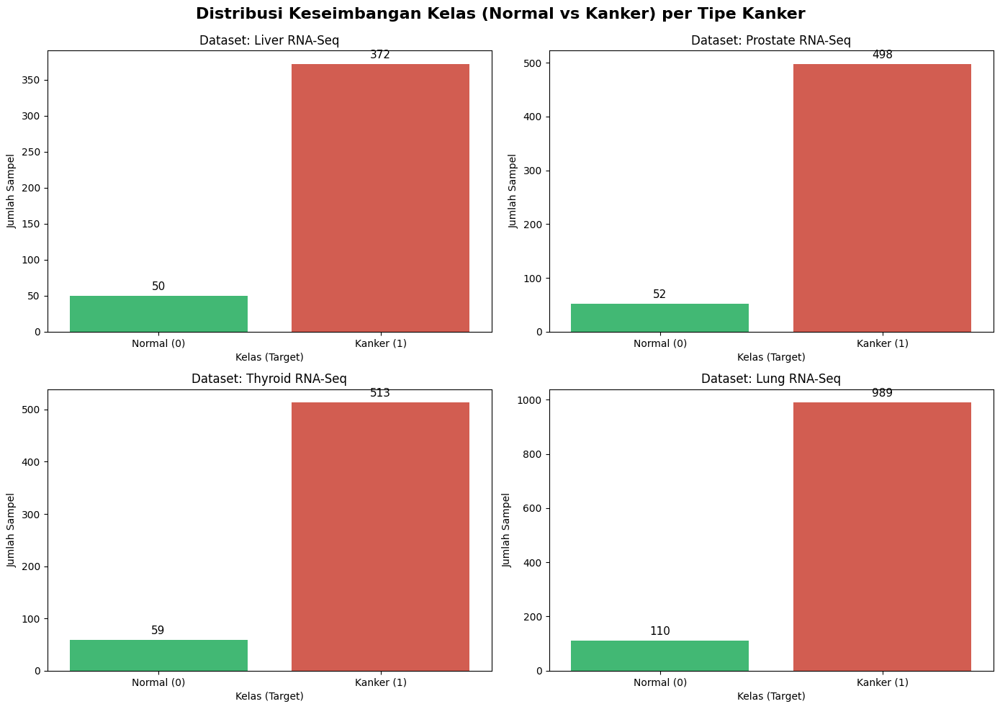


[INFO] Ringkasan Keseimbangan Data (Minoritas vs Mayoritas):
[DATA] Liver    -> Normal (0): 50    | Kanker (1): 372   | Status: TIDAK SEIMBANG (Imbalanced)
[DATA] Prostate -> Normal (0): 52    | Kanker (1): 498   | Status: TIDAK SEIMBANG (Imbalanced)
[DATA] Thyroid  -> Normal (0): 59    | Kanker (1): 513   | Status: TIDAK SEIMBANG (Imbalanced)
[DATA] Lung     -> Normal (0): 110   | Kanker (1): 989   | Status: TIDAK SEIMBANG (Imbalanced)


In [5]:
# ==============================================================================
# 2.4 ANALISIS KESEIMBANGAN KELAS (NORMAL VS KANKER) PER DATASET
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns

print("[INFO] Memvisualisasikan distribusi kelas (Normal vs Kanker) pada masing-masing tipe kanker...")
print("[INFO] Target Kolom: 'sample_type_id' (0.0 = Normal, 1.0 = Kanker)")

# Mengumpulkan dataframe ke dalam dictionary untuk kemudahan iterasi
datasets = {
    'Liver': df_liver,
    'Prostate': df_prostate,
    'Thyroid': df_thyroid,
    'Lung': df_lung
}

# Membuat kanvas (figure) untuk 4 subplot (2 baris x 2 kolom)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Distribusi Keseimbangan Kelas (Normal vs Kanker) per Tipe Kanker', fontsize=16, fontweight='bold')

axes = axes.flatten()

for i, (name, df) in enumerate(datasets.items()):
    # Menghitung jumlah label pada kolom target
    counts = df['sample_type_id'].value_counts().sort_index()
    
    # Variabel untuk visualisasi
    labels = ['Normal (0)', 'Kanker (1)']
    values = [counts.get(0.0, 0), counts.get(1.0, 0)]
    
    # Membuat Bar Plot 
    sns.barplot(x=labels, y=values, hue=labels, ax=axes[i], palette=['#2ecc71', '#e74c3c'], legend=False)
    
    axes[i].set_title(f'Dataset: {name} RNA-Seq')
    axes[i].set_ylabel('Jumlah Sampel')
    axes[i].set_xlabel('Kelas (Target)')
    
    # Menambahkan anotasi angka di atas setiap bar grafik
    for p in axes[i].patches:
        axes[i].annotate(format(p.get_height(), '.0f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha = 'center', va = 'center', 
                         xytext = (0, 9), 
                         textcoords = 'offset points',
                         fontsize=11)

plt.tight_layout()
fig.subplots_adjust(top=0.92) # Menyesuaikan jarak judul utama
plt.show()

# Mencetak ringkasan log analisis (Deteksi Kelas Minoritas dan Mayoritas)
print("\n[INFO] Ringkasan Keseimbangan Data (Minoritas vs Mayoritas):")
for name, df in datasets.items():
    counts = df['sample_type_id'].value_counts()
    normal_count = counts.get(0.0, 0)
    cancer_count = counts.get(1.0, 0)
    
    # Deteksi sederhana apakah dataset seimbang atau tidak
    status = "Seimbang" if abs(normal_count - cancer_count) < (0.2 * len(df)) else "TIDAK SEIMBANG (Imbalanced)"
    print(f"[DATA] {name:8s} -> Normal (0): {normal_count:<5} | Kanker (1): {cancer_count:<5} | Status: {status}")

[INFO] Mengeksplorasi distribusi nilai ekspresi gen berdasarkan kelas (Normal vs Kanker)
[INFO] Menganalisis 4 fitur gen pertama dari masing-masing dataset (Liver, Prostate, Thyroid, Lung).

ANALISIS DISTRIBUSI: LIVER RNA-SEQ


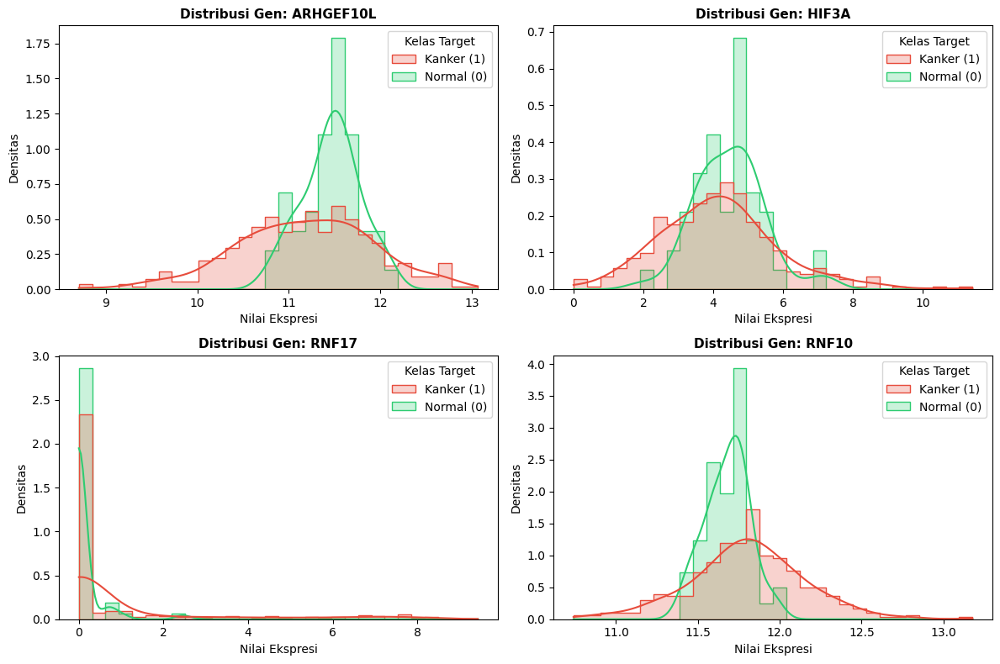

[INFO] Statistik Deskriptif Gen Sampel - Dataset Liver:


Kelas Target     Kanker (1)  Normal (0)
ARHGEF10L count  372.000000   50.000000
          mean    11.170100   11.463892
          std      0.754869    0.313779
          min      8.704400   10.772500
          25%     10.663925   11.283100
          50%     11.195000   11.488900
          75%     11.702850   11.661250
          max     13.065900   12.097400
HIF3A     count  372.000000   50.000000
          mean     4.152187    4.467462
          std      1.727309    0.978043
          min      0.000000    1.986000
          25%      2.988075    3.805900
          50%      4.083450    4.573650
          75%      5.017500    4.939950
          max     11.421700    7.175500
RNF17     count  372.000000   50.000000
          mean     0.955784    0.111474
          std      2.102548    0.402863
          min      0.000000    0.000000
          25%      0.000000    0.000000
          50%      0.000000    0.000000
          75%      0.561050    0.000000
          max      9.427400    2.465200
RNF10     count  372.000000   50.000000
          mean    11.802750   11.680498
          std      0.355046    0.133162
          min     10.739900   11.392300
          25%     11.602825   11.592325
          50%     11.808350   11.698250
          75%     12.017550   11.763700
          max     13.178100   11.973900


ANALISIS DISTRIBUSI: PROSTATE RNA-SEQ


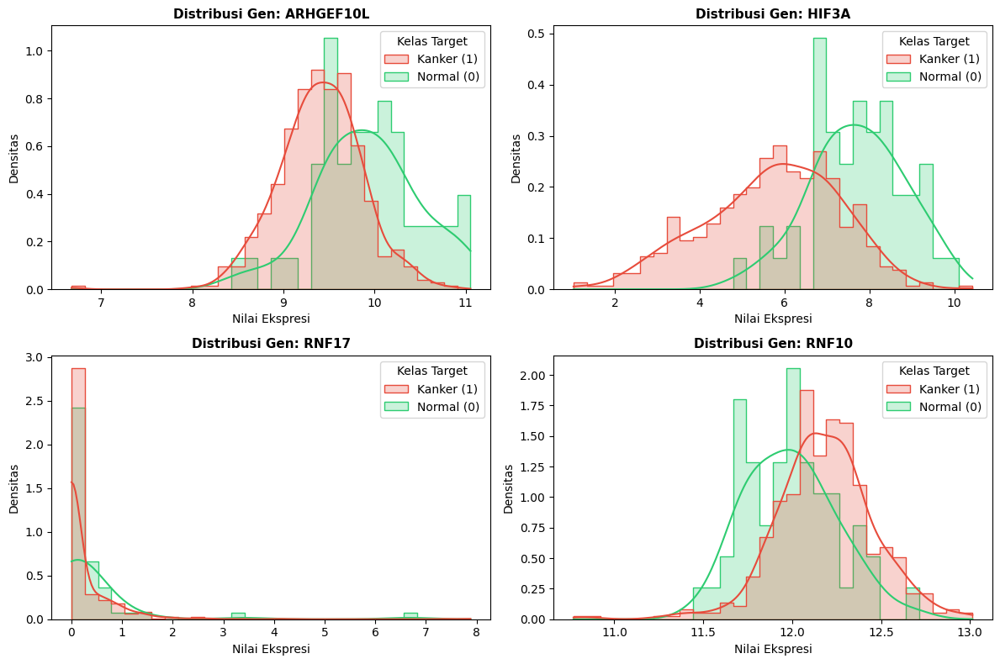

[INFO] Statistik Deskriptif Gen Sampel - Dataset Prostate:


Kelas Target     Kanker (1)  Normal (0)
ARHGEF10L count  498.000000   52.000000
          mean     9.404965    9.922569
          std      0.463048    0.567605
          min      6.672600    8.489300
          25%      9.105300    9.543700
          50%      9.409300    9.933450
          75%      9.690950   10.256975
          max     10.868900   11.053900
HIF3A     count  498.000000   52.000000
          mean     5.707890    7.713481
          std      1.572545    1.104961
          min      1.027900    4.926600
          25%      4.693825    6.922875
          50%      5.832350    7.795200
          75%      6.902425    8.447875
          max     10.428200    9.877400
RNF17     count  498.000000   52.000000
          mean     0.247226    0.402810
          std      0.671174    1.049358
          min      0.000000    0.000000
          25%      0.000000    0.000000
          50%      0.000000    0.000000
          75%      0.000000    0.490350
          max      7.881900    6.675200
RNF10     count  498.000000   52.000000
          mean    12.182968   11.990948
          std      0.277833    0.253726
          min     10.770600   11.472000
          25%     12.025525   11.803050
          50%     12.184200   11.986700
          75%     12.343150   12.133800
          max     13.014400   12.673600


ANALISIS DISTRIBUSI: THYROID RNA-SEQ


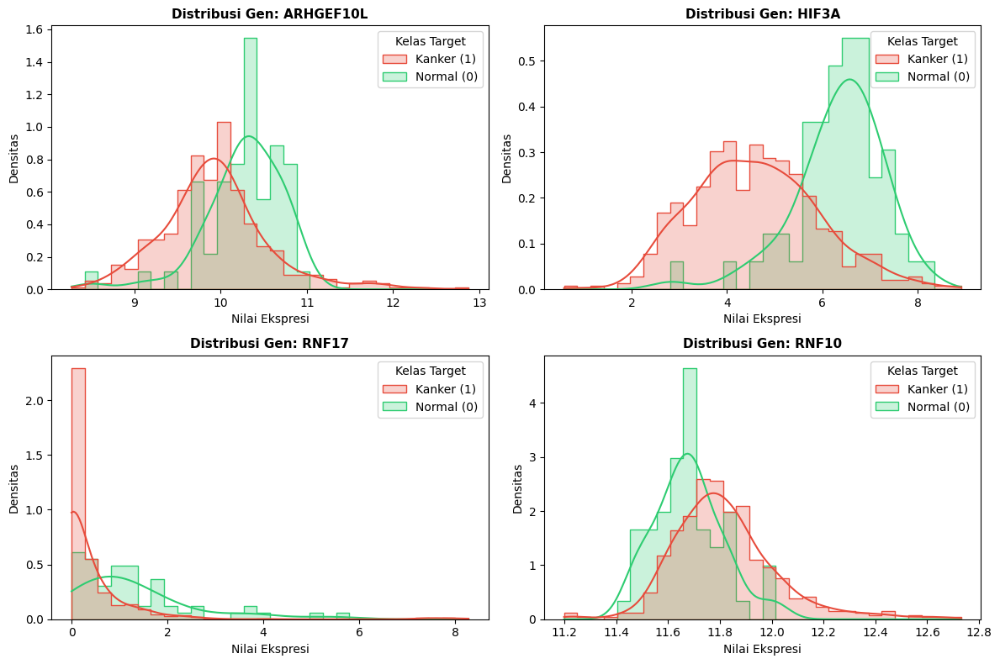

[INFO] Statistik Deskriptif Gen Sampel - Dataset Thyroid:


Kelas Target     Kanker (1)  Normal (0)
ARHGEF10L count  513.000000   59.000000
          mean     9.928173   10.272371
          std      0.619684    0.447371
          min      8.269100    8.498000
          25%      9.562400   10.082300
          50%      9.897700   10.306600
          75%     10.209900   10.594850
          max     12.873800   10.946400
HIF3A     count  513.000000   59.000000
          mean     4.594908    6.343929
          std      1.308893    0.942556
          min      0.583800    2.836800
          25%      3.683500    5.875650
          50%      4.565800    6.509300
          75%      5.481600    6.915100
          max      8.909600    8.215200
RNF17     count  513.000000   59.000000
          mean     0.408443    1.299937
          std      0.977761    1.245703
          min      0.000000    0.000000
          25%      0.000000    0.492750
          50%      0.000000    0.942300
          75%      0.480100    1.749050
          max      8.279500    5.625600
RNF10     count  513.000000   59.000000
          mean    11.817747   11.679885
          std      0.203202    0.130577
          min     11.199300   11.452500
          25%     11.684400   11.605300
          50%     11.790900   11.682800
          75%     11.908100   11.737450
          max     12.730600   12.015900


ANALISIS DISTRIBUSI: LUNG RNA-SEQ


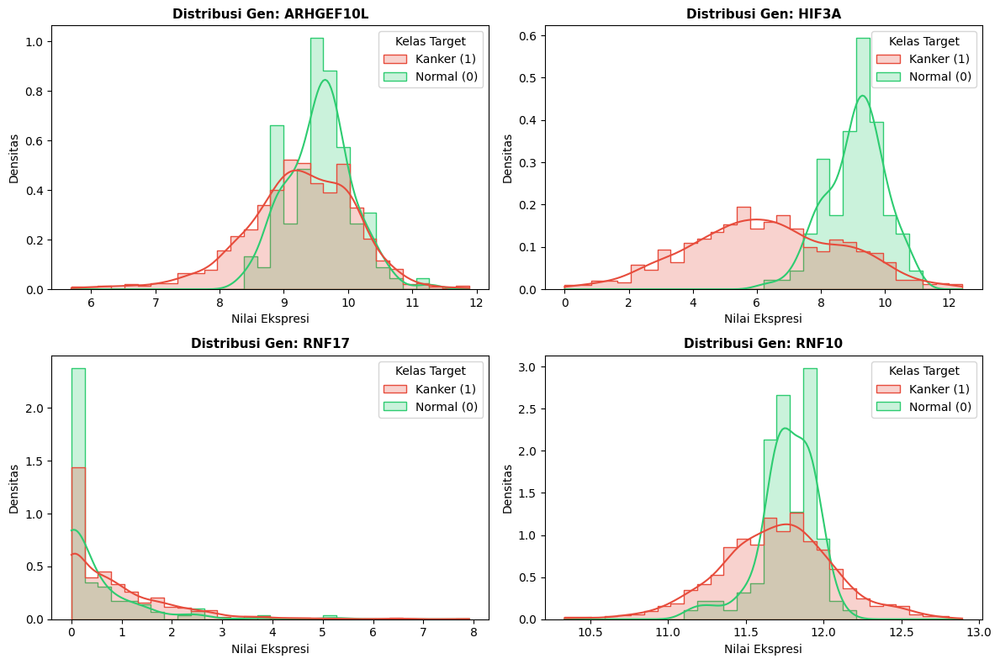

[INFO] Statistik Deskriptif Gen Sampel - Dataset Lung:


Kelas Target     Kanker (1)  Normal (0)
ARHGEF10L count  989.000000  110.000000
          mean     9.243373    9.558195
          std      0.861664    0.505706
          min      5.692200    8.419300
          25%      8.761800    9.218000
          50%      9.284800    9.587150
          75%      9.858500    9.848875
          max     11.885100   11.257100
HIF3A     count  989.000000  110.000000
          mean     6.281326    9.076529
          std      2.360320    0.910398
          min      0.000000    6.271700
          25%      4.628500    8.465375
          50%      6.231500    9.178950
          75%      8.004100    9.670750
          max     12.407100   10.858400
RNF17     count  989.000000  110.000000
          mean     0.861357    0.438702
          std      1.093931    0.824815
          min      0.000000    0.000000
          25%      0.000000    0.000000
          50%      0.547800    0.000000
          75%      1.276600    0.593050
          max      7.910300    5.240700
RNF10     count  989.000000  110.000000
          mean    11.695304   11.769056
          std      0.371218    0.180926
          min     10.334500   11.129300
          25%     11.457400   11.678575
          50%     11.701100   11.777300
          75%     11.921200   11.895600
          max     12.892800   12.132700

In [6]:
# ==============================================================================
# 2.5 ANALISIS DISTRIBUSI NILAI FITUR (GENE EXPRESSION) BERDASARKAN KELAS
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns
import gc

print("[INFO] Mengeksplorasi distribusi nilai ekspresi gen berdasarkan kelas (Normal vs Kanker)")
print("[INFO] Menganalisis 4 fitur gen pertama dari masing-masing dataset (Liver, Prostate, Thyroid, Lung).")

# Menggunakan dictionary dataset yang sudah didefinisikan sebelumnya
datasets = {
    'Liver': df_liver,
    'Prostate': df_prostate,
    'Thyroid': df_thyroid,
    'Lung': df_lung
}

for name, df in datasets.items():
    print("\n" + "=" * 60)
    print(f"ANALISIS DISTRIBUSI: {name.upper()} RNA-SEQ")
    print("=" * 60)
    
    # Mengambil 4 fitur gen pertama (kolom indeks 0 sampai 3)
    sample_genes = df.columns[0:4]
    
    # Membuat salinan dataframe khusus untuk visualisasi
    df_plot = df.copy()
    df_plot['Kelas Target'] = df_plot['sample_type_id'].map({0.0: 'Normal (0)', 1.0: 'Kanker (1)'})
    
    # Membuat figure dengan 4 subplot (2x2)
    plt.figure(figsize=(12, 8))
    for i, gene in enumerate(sample_genes, 1):
        plt.subplot(2, 2, i)
        
        # Plot histogram dengan pemisahan warna Normal vs Kanker
        sns.histplot(data=df_plot, x=gene, hue='Kelas Target', kde=True, bins=30, 
                     palette={'Normal (0)': '#2ecc71', 'Kanker (1)': '#e74c3c'}, 
                     element="step", stat="density", common_norm=False)
        
        plt.title(f'Distribusi Gen: {gene}', fontsize=11, fontweight='bold')
        plt.xlabel('Nilai Ekspresi')
        plt.ylabel('Densitas')
    
    plt.tight_layout()
    plt.show()
    
    # Menampilkan ringkasan statistik deskriptif per dataset
    print(f"[INFO] Statistik Deskriptif Gen Sampel - Dataset {name}:")
    display(df_plot.groupby('Kelas Target')[sample_genes].describe().T)
    
    # Membersihkan memori plot untuk dataset saat ini sebelum lanjut ke iterasi berikutnya
    del df_plot
    gc.collect()

In [7]:
# ==============================================================================
# 3.1 PENANGANAN NILAI KOSONG & DUPLIKAT
# ==============================================================================
print("[INFO] Memulai proses pembersihan data: Missing Values dan Duplikat")

# Menggunakan kembali dictionary dataset dari Part 2
datasets = {
    'Liver': df_liver,
    'Prostate': df_prostate,
    'Thyroid': df_thyroid,
    'Lung': df_lung
}

for name, df in datasets.items():
    initial_rows = df.shape[0]
    
    # 1. Hapus Missing Values (NaN)
    df = df.dropna()
    na_dropped = initial_rows - df.shape[0]
    
    # 2. Hapus Duplikat
    current_rows = df.shape[0]
    df = df.drop_duplicates()
    dup_dropped = current_rows - df.shape[0]
    
    # Update dataset di dictionary agar perubahan tersimpan
    datasets[name] = df
    
    print(f"[DATA] {name:8s} | Dihapus {na_dropped} baris NaN | Dihapus {dup_dropped} baris Duplikat | Sisa Sampel: {df.shape[0]}")

# Memperbarui variabel aslinya 
df_liver = datasets['Liver']
df_prostate = datasets['Prostate']
df_thyroid = datasets['Thyroid']
df_lung = datasets['Lung']

[INFO] Memulai proses pembersihan data: Missing Values dan Duplikat
[DATA] Liver    | Dihapus 0 baris NaN | Dihapus 0 baris Duplikat | Sisa Sampel: 422
[DATA] Prostate | Dihapus 0 baris NaN | Dihapus 0 baris Duplikat | Sisa Sampel: 550
[DATA] Thyroid  | Dihapus 0 baris NaN | Dihapus 0 baris Duplikat | Sisa Sampel: 572
[DATA] Lung     | Dihapus 0 baris NaN | Dihapus 0 baris Duplikat | Sisa Sampel: 1099


In [8]:
# ==============================================================================
# 3.2 ELIMINASI FITUR STATIS (VARIANCE = 0)
# ==============================================================================
print("[INFO] Memulai proses eliminasi fitur gen yang konstan (statis) di seluruh sampel")

for name, df in datasets.items():
    # Memisahkan sementara fitur dan label agar label target tidak ikut dievaluasi
    features = df.drop(columns=['sample_type_id'])
    
    # Mencari kolom yang hanya memiliki 1 nilai unik (statis)
    static_cols = features.columns[features.nunique() <= 1]
    
    # Menghapus kolom statis dari dataframe utama
    df = df.drop(columns=static_cols)
    
    # Simpan kembali ke dictionary
    datasets[name] = df
    
    print(f"[DATA] {name:8s} | Fitur statis dihapus: {len(static_cols):>4} | Sisa Fitur Gen: {df.shape[1]-1}")

# Memperbarui variabel aslinya kembali
df_liver = datasets['Liver']
df_prostate = datasets['Prostate']
df_thyroid = datasets['Thyroid']
df_lung = datasets['Lung']

[INFO] Memulai proses eliminasi fitur gen yang konstan (statis) di seluruh sampel
[DATA] Liver    | Fitur statis dihapus:  362 | Sisa Fitur Gen: 20168
[DATA] Prostate | Fitur statis dihapus:  298 | Sisa Fitur Gen: 20232
[DATA] Thyroid  | Fitur statis dihapus:  366 | Sisa Fitur Gen: 20164
[DATA] Lung     | Fitur statis dihapus:  272 | Sisa Fitur Gen: 20258


In [9]:
# ==============================================================================
# 3.3 STRATIFIED SPLITTING & EXPORT CSV
# ==============================================================================
print("[INFO] Melakukan Stratified Splitting (70% Train, 15% Val, 15% Test) per dataset")

for name, df in datasets.items():
    print(f"\n[PROSES] Splitting Dataset: {name.upper()}")
    
    train_df, temp_df = train_test_split(
        df, test_size=0.30, random_state=42, stratify=df['sample_type_id']
    )
    
    val_df, test_df = train_test_split(
        temp_df, test_size=0.50, random_state=42, stratify=temp_df['sample_type_id']
    )
    
    train_file = os.path.join(WORKING_PATH, f"{name}train.csv")
    val_file   = os.path.join(WORKING_PATH, f"{name}val.csv")
    test_file  = os.path.join(WORKING_PATH, f"{name}test.csv")
    
    train_df.to_csv(train_file, index=False)
    val_df.to_csv(val_file, index=False)
    test_df.to_csv(test_file, index=False)
    
    print(f"  - Latih (Train) : {len(train_df):>4} sampel -> {name}train.csv")
    print(f"  - Validasi (Val): {len(val_df):>4} sampel -> {name}val.csv")
    print(f"  - Uji (Test)    : {len(test_df):>4} sampel -> {name}test.csv")

print("\n" + "=" * 80)
print("[INFO] Menghapus dataset original dari RAM sistem")
del df_liver, df_prostate, df_thyroid, df_lung, datasets
gc.collect()

print("[INFO] STATUS: PART 3 SELESAI.")

[INFO] Melakukan Stratified Splitting (70% Train, 15% Val, 15% Test) per dataset

[PROSES] Splitting Dataset: LIVER
  - Latih (Train) :  295 sampel -> Livertrain.csv
  - Validasi (Val):   63 sampel -> Liverval.csv
  - Uji (Test)    :   64 sampel -> Livertest.csv

[PROSES] Splitting Dataset: PROSTATE
  - Latih (Train) :  385 sampel -> Prostatetrain.csv
  - Validasi (Val):   82 sampel -> Prostateval.csv
  - Uji (Test)    :   83 sampel -> Prostatetest.csv

[PROSES] Splitting Dataset: THYROID
  - Latih (Train) :  400 sampel -> Thyroidtrain.csv
  - Validasi (Val):   86 sampel -> Thyroidval.csv
  - Uji (Test)    :   86 sampel -> Thyroidtest.csv

[PROSES] Splitting Dataset: LUNG
  - Latih (Train) :  769 sampel -> Lungtrain.csv
  - Validasi (Val):  165 sampel -> Lungval.csv
  - Uji (Test)    :  165 sampel -> Lungtest.csv

[INFO] Menghapus dataset original dari RAM sistem
[INFO] STATUS: PART 3 SELESAI.


In [10]:
# ==============================================================================
# 4.1 NORMALISASI MIN-MAX SCALING
# ==============================================================================
from sklearn.preprocessing import MinMaxScaler

print("[INFO] Memuat data dari Part 3 dan melakukan Normalisasi Min-Max")

cancer_types = ['Liver', 'Prostate', 'Thyroid', 'Lung']
processed_data = {} 

for name in cancer_types:
    df_train = pd.read_csv(os.path.join(WORKING_PATH, f"{name}train.csv"))
    df_val   = pd.read_csv(os.path.join(WORKING_PATH, f"{name}val.csv"))
    df_test  = pd.read_csv(os.path.join(WORKING_PATH, f"{name}test.csv"))
    
    X_train = df_train.drop(columns=['sample_type_id']).values
    y_train = df_train['sample_type_id'].values
    
    X_val = df_val.drop(columns=['sample_type_id']).values
    y_val = df_val['sample_type_id'].values
    
    X_test = df_test.drop(columns=['sample_type_id']).values
    y_test = df_test['sample_type_id'].values
    
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)
    
    processed_data[name] = {
        'X_train': X_train_scaled, 'y_train': y_train,
        'X_val': X_val_scaled, 'y_val': y_val,
        'X_test': X_test_scaled, 'y_test': y_test
    }
    
    print(f"[DATA] {name:8s} | Normalisasi Selesai | Dimensi X_train 2D: {X_train_scaled.shape}")

del df_train, df_val, df_test, X_train, X_val, X_test
gc.collect()

[INFO] Memuat data dari Part 3 dan melakukan Normalisasi Min-Max
[DATA] Liver    | Normalisasi Selesai | Dimensi X_train 2D: (295, 20168)
[DATA] Prostate | Normalisasi Selesai | Dimensi X_train 2D: (385, 20232)
[DATA] Thyroid  | Normalisasi Selesai | Dimensi X_train 2D: (400, 20164)
[DATA] Lung     | Normalisasi Selesai | Dimensi X_train 2D: (769, 20258)


0

In [11]:
# ==============================================================================
# 4.2 TRANSFORMASI 3D (RESHAPING) & EKSPOR (.NPY)
# ==============================================================================
print("[INFO] Melakukan Reshaping array menjadi format 3D dan menyimpan ke disk")

for name, data in processed_data.items():
    X_train_3d = np.expand_dims(data['X_train'], axis=-1)
    X_val_3d   = np.expand_dims(data['X_val'], axis=-1)
    X_test_3d  = np.expand_dims(data['X_test'], axis=-1)
    
    print(f"[DATA] {name:8s} | Dimensi X_train 3D siap latih: {X_train_3d.shape}")
    
    np.save(os.path.join(WORKING_PATH, f"{name}_X_train.npy"), X_train_3d)
    np.save(os.path.join(WORKING_PATH, f"{name}_y_train.npy"), data['y_train'])
    
    np.save(os.path.join(WORKING_PATH, f"{name}_X_val.npy"), X_val_3d)
    np.save(os.path.join(WORKING_PATH, f"{name}_y_val.npy"), data['y_val'])
    
    np.save(os.path.join(WORKING_PATH, f"{name}_X_test.npy"), X_test_3d)
    np.save(os.path.join(WORKING_PATH, f"{name}_y_test.npy"), data['y_test'])

print("\n" + "=" * 80)
print("[INFO] STATUS: PART 4.1 & 4.2 SELESAI.")

del processed_data
gc.collect()

[INFO] Melakukan Reshaping array menjadi format 3D dan menyimpan ke disk
[DATA] Liver    | Dimensi X_train 3D siap latih: (295, 20168, 1)
[DATA] Prostate | Dimensi X_train 3D siap latih: (385, 20232, 1)
[DATA] Thyroid  | Dimensi X_train 3D siap latih: (400, 20164, 1)
[DATA] Lung     | Dimensi X_train 3D siap latih: (769, 20258, 1)

[INFO] STATUS: PART 4.1 & 4.2 SELESAI.


0

In [12]:
# ==============================================================================
# 4.3 SELEKSI FITUR (FEATURE SELECTION) - MULTIPLE K (50, 100, 200)
# ==============================================================================
from sklearn.feature_selection import SelectKBest, f_classif

print("="*80)
print("[INFO] MEMULAI FEATURE SELECTION (MENYIMPAN VARIAN 50, 100, 200 GEN TERBAIK)")
print("="*80)

k_features_list = [50, 100, 200]

for cancer in cancer_types:
    print(f"\n[PROSES] Seleksi Fitur untuk dataset: {cancer.upper()}")
    
    X_train_3d = np.load(os.path.join(WORKING_PATH, f"{cancer}_X_train.npy"))
    y_train    = np.load(os.path.join(WORKING_PATH, f"{cancer}_y_train.npy")).astype(int)
    X_val_3d   = np.load(os.path.join(WORKING_PATH, f"{cancer}_X_val.npy"))
    X_test_3d  = np.load(os.path.join(WORKING_PATH, f"{cancer}_X_test.npy"))
    
    csv_path = os.path.join(WORKING_PATH, f"{cancer}train.csv")
    gene_names = np.array(pd.read_csv(csv_path, nrows=0).drop(columns=['sample_type_id']).columns.tolist())
    
    X_train_2d = np.squeeze(X_train_3d, axis=-1)
    X_val_2d   = np.squeeze(X_val_3d, axis=-1)
    X_test_2d  = np.squeeze(X_test_3d, axis=-1)
    
    for k in k_features_list:
        selector = SelectKBest(score_func=f_classif, k=k)
        X_train_sel = selector.fit_transform(X_train_2d, y_train)
        X_val_sel   = selector.transform(X_val_2d)
        X_test_sel  = selector.transform(X_test_2d)
        
        mask = selector.get_support()
        selected_genes = gene_names[mask]
        
        X_train_top_3d = np.expand_dims(X_train_sel, axis=-1)
        X_val_top_3d   = np.expand_dims(X_val_sel, axis=-1)
        X_test_top_3d  = np.expand_dims(X_test_sel, axis=-1)
        
        np.save(os.path.join(WORKING_PATH, f"{cancer}_X_train_top{k}.npy"), X_train_top_3d)
        np.save(os.path.join(WORKING_PATH, f"{cancer}_X_val_top{k}.npy"), X_val_top_3d)
        np.save(os.path.join(WORKING_PATH, f"{cancer}_X_test_top{k}.npy"), X_test_top_3d)
        np.save(os.path.join(WORKING_PATH, f"{cancer}_top{k}_genes.npy"), selected_genes)
        
        print(f" -> K={k:3d} | Dimensi: {X_train_top_3d.shape} | Disimpan sukses.")

print("\n[SELESAI] Variasi dataset fitur (50, 100, 200) telah diekspor.")

[INFO] MEMULAI FEATURE SELECTION (MENYIMPAN VARIAN 50, 100, 200 GEN TERBAIK)

[PROSES] Seleksi Fitur untuk dataset: LIVER
 -> K= 50 | Dimensi: (295, 50, 1) | Disimpan sukses.
 -> K=100 | Dimensi: (295, 100, 1) | Disimpan sukses.
 -> K=200 | Dimensi: (295, 200, 1) | Disimpan sukses.

[PROSES] Seleksi Fitur untuk dataset: PROSTATE
 -> K= 50 | Dimensi: (385, 50, 1) | Disimpan sukses.
 -> K=100 | Dimensi: (385, 100, 1) | Disimpan sukses.
 -> K=200 | Dimensi: (385, 200, 1) | Disimpan sukses.

[PROSES] Seleksi Fitur untuk dataset: THYROID
 -> K= 50 | Dimensi: (400, 50, 1) | Disimpan sukses.
 -> K=100 | Dimensi: (400, 100, 1) | Disimpan sukses.
 -> K=200 | Dimensi: (400, 200, 1) | Disimpan sukses.

[PROSES] Seleksi Fitur untuk dataset: LUNG
 -> K= 50 | Dimensi: (769, 50, 1) | Disimpan sukses.
 -> K=100 | Dimensi: (769, 100, 1) | Disimpan sukses.
 -> K=200 | Dimensi: (769, 200, 1) | Disimpan sukses.

[SELESAI] Variasi dataset fitur (50, 100, 200) telah diekspor.


In [2]:
# ==============================================================================
# 5. ARSITEKTUR MODEL DEEP LEARNING & PENGUNCI SEED
# ==============================================================================
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.regularizers import l2

def reset_random_seeds(seed_value=42):
    """Mengunci angka acak agar inisialisasi bobot reproduksibel."""
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.random.set_seed(seed_value)

In [3]:
# ------------------------------------------------------------------------------
# 5.1 ARSITEKTUR TCN ORIGINAL (MAX POOLING)
# ------------------------------------------------------------------------------
def build_tcn_model(input_shape, strategy, learning_rate=0.0005, dropout_rate=0.4, l2_rate=1e-4):
    reset_random_seeds(42) 
    with strategy.scope():
        inputs = layers.Input(shape=input_shape)
        x = inputs
        for dilation_rate in [1, 2, 4]:
            x = layers.Conv1D(
                filters=32, kernel_size=3, padding='causal', dilation_rate=dilation_rate, 
                activation='relu', kernel_regularizer=l2(l2_rate)
            )(x)
            x = layers.BatchNormalization()(x)
        x = layers.GlobalMaxPooling1D()(x) 
        x = layers.Dense(32, activation='relu', kernel_regularizer=l2(l2_rate))(x)
        x = layers.Dropout(dropout_rate)(x) 
        outputs = layers.Dense(1, activation='sigmoid')(x)
        model = models.Model(inputs=inputs, outputs=outputs, name="TCN_Max_Cancer_Classifier")
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                      loss='binary_crossentropy', 
                      metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])
    return model

In [4]:
# ------------------------------------------------------------------------------
# 5.2 ARSITEKTUR LSTM 
# ------------------------------------------------------------------------------
def build_lstm_model(input_shape, strategy, learning_rate=0.0003, lstm_units=16, dropout_rate=0.4):
    reset_random_seeds(42) 
    with strategy.scope():
        inputs = layers.Input(shape=input_shape)
        x = layers.LSTM(lstm_units, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Dense(32, activation='relu', kernel_regularizer=l2(1e-4))(x)
        x = layers.Dropout(dropout_rate)(x) 
        outputs = layers.Dense(1, activation='sigmoid')(x)
        model = models.Model(inputs=inputs, outputs=outputs, name="LSTM_Cancer_Classifier")
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                      loss='binary_crossentropy', 
                      metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])
    return model

In [5]:
# ------------------------------------------------------------------------------
# 5.3 ARSITEKTUR TCN DENGAN GLOBAL AVERAGE POOLING
# ------------------------------------------------------------------------------
def build_tcn_avg_model(input_shape, strategy, learning_rate=0.0005, dropout_rate=0.4, l2_rate=1e-4):
    reset_random_seeds(42) 
    with strategy.scope():
        inputs = layers.Input(shape=input_shape)
        x = inputs
        for dilation_rate in [1, 2, 4]:
            x = layers.Conv1D(
                filters=32, kernel_size=3, padding='causal', dilation_rate=dilation_rate, 
                activation='relu', kernel_regularizer=l2(l2_rate)
            )(x)
            x = layers.BatchNormalization()(x)
        x = layers.GlobalAveragePooling1D()(x) 
        x = layers.Dense(32, activation='relu', kernel_regularizer=l2(l2_rate))(x)
        x = layers.Dropout(dropout_rate)(x) 
        outputs = layers.Dense(1, activation='sigmoid')(x)
        model = models.Model(inputs=inputs, outputs=outputs, name="TCN_Avg_Cancer_Classifier")
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                      loss='binary_crossentropy', 
                      metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])
    return model

print("[INFO] Arsitektur TCN Max, TCN Avg, dan LSTM berhasil diinisialisasi.")

[INFO] Arsitektur TCN Max, TCN Avg, dan LSTM berhasil diinisialisasi.


In [17]:
# ==============================================================================
# 6.0 INISIALISASI LOG PELATIHAN & FINAL CONFIGURATIONS (V2 FEATURE SELECTION)
# ==============================================================================
import time
import os
import gc
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

print("[INFO] Menginisialisasi environment pelatihan (Final Best Configuration V2).")

training_times = []
cancer_types = ['Liver', 'Prostate', 'Thyroid', 'Lung'] #
base_path = WORKING_PATH + "\\"
strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")

# Fungsi dinamis untuk menerapkan metode balancing
def apply_balancing(X, y, method):
    if method == 'SMOTE':
        return SMOTE(random_state=42).fit_resample(X, y)
    elif method == 'Undersampling':
        return RandomUnderSampler(random_state=42).fit_resample(X, y)
    return X, y

[INFO] Menginisialisasi environment pelatihan (Final Best Configuration V2).


In [18]:
# ==============================================================================
# 6.1.A PELATIHAN TCN MAX: LIVER RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Liver'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 16, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 30, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN MAX | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_max_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

# Load data sesuai jumlah fitur terbaik
X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_model = build_tcn_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_model.save_weights(weight_path)


elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Max', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN MAX | LIVER RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 16, LR 0.001
Epoch 1/100
33/33 - 5s - loss: 0.3212 - accuracy: 0.8962 - auc: 0.9405 - val_loss: 0.7395 - val_accuracy: 0.1111 - val_auc: 0.9872 - 5s/epoch - 140ms/step
Epoch 2/100
33/33 - 0s - loss: 0.0680 - accuracy: 0.9712 - auc: 0.9971 - val_loss: 0.7479 - val_accuracy: 0.1111 - val_auc: 0.9974 - 312ms/epoch - 9ms/step
Epoch 3/100
33/33 - 0s - loss: 0.0266 - accuracy: 0.9904 - auc: 0.9998 - val_loss: 0.7452 - val_accuracy: 0.1111 - val_auc: 1.0000 - 306ms/epoch - 9ms/step
Epoch 4/100
33/33 - 0s - loss: 0.0205 - accuracy: 0.9923 - auc: 0.9999 - val_loss: 0.7451 - val_accuracy: 0.1111 - val_auc: 1.0000 - 326ms/epoch - 10ms/step
Epoch 5/100
33/33 - 0s - loss: 0.0212 - accuracy: 0.9962 - auc: 0.9998 - val_loss: 0.7055 - val_accuracy: 0.3175 - val_auc: 1.0000 - 299ms/epoch - 9ms/step
Epoch 6/100
33/33 - 0s - loss: 0.0106 - accuracy: 0.9981 - auc: 1.0000 - val_loss: 0.6600 - val_accuracy: 0.6667 - val_auc: 1.0000 - 

6754

In [19]:
# ==============================================================================
# 6.1.B PELATIHAN TCN MAX: LUNG RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Lung'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 128, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 20, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN MAX | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_max_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_model = build_tcn_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_model.save_weights(weight_path)


elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Max', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN MAX | LUNG RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 128, LR 0.001
Epoch 1/100
11/11 - 1s - loss: 0.4745 - accuracy: 0.8100 - auc: 0.8988 - val_loss: 0.7006 - val_accuracy: 0.1273 - val_auc: 0.9587 - 1s/epoch - 132ms/step
Epoch 2/100
11/11 - 0s - loss: 0.0725 - accuracy: 0.9819 - auc: 0.9986 - val_loss: 0.7236 - val_accuracy: 0.0970 - val_auc: 0.9144 - 153ms/epoch - 14ms/step
Epoch 3/100
11/11 - 0s - loss: 0.0320 - accuracy: 0.9935 - auc: 0.9997 - val_loss: 0.7337 - val_accuracy: 0.0970 - val_auc: 0.8314 - 139ms/epoch - 13ms/step
Epoch 4/100
11/11 - 0s - loss: 0.0302 - accuracy: 0.9906 - auc: 0.9990 - val_loss: 0.7363 - val_accuracy: 0.0970 - val_auc: 0.8242 - 139ms/epoch - 13ms/step
Epoch 5/100
11/11 - 0s - loss: 0.0215 - accuracy: 0.9942 - auc: 0.9998 - val_loss: 0.7361 - val_accuracy: 0.0970 - val_auc: 0.8507 - 146ms/epoch - 13ms/step
Epoch 6/100
11/11 - 0s - loss: 0.0196 - accuracy: 0.9964 - auc: 0.9998 - val_loss: 0.7384 - val_accuracy: 0.0970 - val_auc: 0.9029

10348

In [20]:
# ==============================================================================
# 6.1.C PELATIHAN TCN MAX: PROSTATE RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Prostate'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 16, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 40, 'epochs': 150}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN MAX | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_max_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_model = build_tcn_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Max', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN MAX | PROSTATE RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 16, LR 0.001
Epoch 1/150
44/44 - 2s - loss: 0.2611 - accuracy: 0.9083 - auc: 0.9560 - val_loss: 0.6416 - val_accuracy: 0.9024 - val_auc: 0.8902 - 2s/epoch - 38ms/step
Epoch 2/150
44/44 - 0s - loss: 0.1355 - accuracy: 0.9613 - auc: 0.9877 - val_loss: 0.6416 - val_accuracy: 0.9146 - val_auc: 0.8117 - 458ms/epoch - 10ms/step
Epoch 3/150
44/44 - 0s - loss: 0.0936 - accuracy: 0.9642 - auc: 0.9935 - val_loss: 0.6392 - val_accuracy: 0.9390 - val_auc: 0.8209 - 403ms/epoch - 9ms/step
Epoch 4/150
44/44 - 0s - loss: 0.0629 - accuracy: 0.9828 - auc: 0.9965 - val_loss: 0.5830 - val_accuracy: 0.9512 - val_auc: 0.9341 - 417ms/epoch - 9ms/step
Epoch 5/150
44/44 - 0s - loss: 0.0491 - accuracy: 0.9857 - auc: 0.9988 - val_loss: 0.5608 - val_accuracy: 0.9756 - val_auc: 0.9375 - 424ms/epoch - 10ms/step
Epoch 6/150
44/44 - 0s - loss: 0.0419 - accuracy: 0.9928 - auc: 0.9982 - val_loss: 0.4901 - val_accuracy: 0.9756 - val_auc: 0.9282

12876

In [21]:
# ==============================================================================
# 6.1.D PELATIHAN TCN MAX: THYROID RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Thyroid'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 32, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 25, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN MAX | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_max_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_model = build_tcn_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_model.save_weights(weight_path)


elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Max', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN MAX | THYROID RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 32, LR 0.001
Epoch 1/100
23/23 - 2s - loss: 0.3411 - accuracy: 0.8774 - auc: 0.9295 - val_loss: 0.7373 - val_accuracy: 0.1047 - val_auc: 0.7309 - 2s/epoch - 66ms/step
Epoch 2/100
23/23 - 0s - loss: 0.0643 - accuracy: 0.9805 - auc: 0.9975 - val_loss: 0.7516 - val_accuracy: 0.1047 - val_auc: 0.8319 - 242ms/epoch - 11ms/step
Epoch 3/100
23/23 - 0s - loss: 0.0384 - accuracy: 0.9916 - auc: 0.9975 - val_loss: 0.7774 - val_accuracy: 0.1047 - val_auc: 0.8802 - 209ms/epoch - 9ms/step
Epoch 4/100
23/23 - 0s - loss: 0.0408 - accuracy: 0.9889 - auc: 0.9975 - val_loss: 0.8120 - val_accuracy: 0.1047 - val_auc: 0.9452 - 236ms/epoch - 10ms/step
Epoch 5/100
23/23 - 0s - loss: 0.0275 - accuracy: 0.9916 - auc: 0.9983 - val_loss: 0.8749 - val_accuracy: 0.1047 - val_auc: 0.9733 - 236ms/epoch - 10ms/step
Epoch 6/100
23/23 - 0s - loss: 0.0227 - accuracy: 0.9958 - auc: 0.9995 - val_loss: 0.9197 - val_accuracy: 0.1047 - val_auc: 0.9892

8767

In [22]:
# ==============================================================================
# 6.2.A PELATIHAN LSTM: LIVER RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Liver'
# Konfigurasi 
config = {'features': 200, 'balancing': 'SMOTE', 'batch_size': 32, 'lr': 0.0001, 'units': 16, 'dropout': 0.4, 'patience': 30, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] LSTM | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_lstm_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

lstm_model = build_lstm_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], lstm_units=config['units'], dropout_rate=config['dropout']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
lstm_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
lstm_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'LSTM', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del lstm_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] LSTM | LIVER RNA-SEQ
-> Config: Top 200 Fitur, SMOTE, Batch 32, LR 0.0001
Epoch 1/100
17/17 - 2s - loss: 0.6536 - accuracy: 0.6250 - auc: 0.7600 - val_loss: 0.6679 - val_accuracy: 0.8889 - val_auc: 0.6352 - 2s/epoch - 138ms/step
Epoch 2/100
17/17 - 0s - loss: 0.6409 - accuracy: 0.6923 - auc: 0.8258 - val_loss: 0.6703 - val_accuracy: 0.8889 - val_auc: 0.7742 - 333ms/epoch - 20ms/step
Epoch 3/100
17/17 - 0s - loss: 0.6429 - accuracy: 0.7135 - auc: 0.8222 - val_loss: 0.6731 - val_accuracy: 0.8889 - val_auc: 0.7474 - 368ms/epoch - 22ms/step
Epoch 4/100
17/17 - 0s - loss: 0.6326 - accuracy: 0.7519 - auc: 0.8434 - val_loss: 0.6756 - val_accuracy: 0.8889 - val_auc: 0.8099 - 347ms/epoch - 20ms/step
Epoch 5/100
17/17 - 0s - loss: 0.6187 - accuracy: 0.7692 - auc: 0.8873 - val_loss: 0.6781 - val_accuracy: 0.8571 - val_auc: 0.8138 - 354ms/epoch - 21ms/step
Epoch 6/100
17/17 - 0s - loss: 0.6056 - accuracy: 0.7923 - auc: 0.8903 - val_loss: 0.6804 - val_accuracy: 0.8889 - val_auc: 0.8099 

15562

In [23]:
# ==============================================================================
# 6.2.B PELATIHAN LSTM: LUNG RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Lung'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 64, 'lr': 0.0005, 'units': 32, 'dropout': 0.4, 'patience': 20, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] LSTM | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_lstm_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

lstm_model = build_lstm_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], lstm_units=config['units'], dropout_rate=config['dropout']
)

#  val_loss DAN MODE KE min (Khusus Lung LSTM V2)
stop = EarlyStopping(monitor='val_loss', mode='min', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
lstm_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
lstm_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'LSTM', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del lstm_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] LSTM | LUNG RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 64, LR 0.0005
Epoch 1/100
22/22 - 2s - loss: 0.6146 - accuracy: 0.7341 - auc: 0.8000 - val_loss: 0.6929 - val_accuracy: 0.7152 - val_auc: 0.9979 - 2s/epoch - 86ms/step
Epoch 2/100
22/22 - 0s - loss: 0.3414 - accuracy: 0.9697 - auc: 0.9971 - val_loss: 0.7134 - val_accuracy: 0.0970 - val_auc: 1.0000 - 277ms/epoch - 13ms/step
Epoch 3/100
22/22 - 0s - loss: 0.1689 - accuracy: 0.9870 - auc: 0.9981 - val_loss: 0.7702 - val_accuracy: 0.0970 - val_auc: 0.9996 - 271ms/epoch - 12ms/step
Epoch 4/100
22/22 - 0s - loss: 0.1020 - accuracy: 0.9848 - auc: 0.9968 - val_loss: 0.8512 - val_accuracy: 0.0970 - val_auc: 0.9994 - 271ms/epoch - 12ms/step
Epoch 5/100
22/22 - 0s - loss: 0.0759 - accuracy: 0.9884 - auc: 0.9965 - val_loss: 0.8373 - val_accuracy: 0.0970 - val_auc: 0.9996 - 242ms/epoch - 11ms/step
Epoch 6/100
22/22 - 0s - loss: 0.0629 - accuracy: 0.9870 - auc: 0.9976 - val_loss: 0.8089 - val_accuracy: 0.1818 - val_auc: 0.9996 - 2

28359

In [24]:
# ==============================================================================
# 6.2.C PELATIHAN LSTM: PROSTATE RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Prostate'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 16, 'lr': 0.0005, 'units': 16, 'dropout': 0.4, 'patience': 30, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] LSTM | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_lstm_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

lstm_model = build_lstm_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], lstm_units=config['units'], dropout_rate=config['dropout']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
lstm_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
lstm_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'LSTM', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del lstm_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] LSTM | PROSTATE RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 16, LR 0.0005
Epoch 1/100
44/44 - 2s - loss: 0.6283 - accuracy: 0.6691 - auc: 0.7880 - val_loss: 0.6157 - val_accuracy: 0.9024 - val_auc: 0.8682 - 2s/epoch - 48ms/step
Epoch 2/100
44/44 - 0s - loss: 0.4613 - accuracy: 0.8954 - auc: 0.9397 - val_loss: 0.4574 - val_accuracy: 0.9024 - val_auc: 0.8868 - 434ms/epoch - 10ms/step
Epoch 3/100
44/44 - 0s - loss: 0.2591 - accuracy: 0.9269 - auc: 0.9727 - val_loss: 0.2438 - val_accuracy: 0.9146 - val_auc: 0.8801 - 431ms/epoch - 10ms/step
Epoch 4/100
44/44 - 0s - loss: 0.1711 - accuracy: 0.9599 - auc: 0.9821 - val_loss: 0.1887 - val_accuracy: 0.9390 - val_auc: 0.8978 - 445ms/epoch - 10ms/step
Epoch 5/100
44/44 - 0s - loss: 0.1882 - accuracy: 0.9470 - auc: 0.9765 - val_loss: 0.1654 - val_accuracy: 0.9390 - val_auc: 0.8894 - 403ms/epoch - 9ms/step
Epoch 6/100
44/44 - 0s - loss: 0.1863 - accuracy: 0.9370 - auc: 0.9771 - val_loss: 0.1555 - val_accuracy: 0.9512 - val_auc: 0.8733 

29022

In [25]:
# ==============================================================================
# 6.2.D PELATIHAN LSTM: THYROID RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Thyroid'
# Konfigurasi
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 32, 'lr': 0.0005, 'units': 16, 'dropout': 0.5, 'patience': 30, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] LSTM | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_lstm_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

lstm_model = build_lstm_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], lstm_units=config['units'], dropout_rate=config['dropout']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
lstm_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
lstm_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'LSTM', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del lstm_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] LSTM | THYROID RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 32, LR 0.0005
Epoch 1/100
23/23 - 2s - loss: 0.6941 - accuracy: 0.4791 - auc: 0.5110 - val_loss: 0.6624 - val_accuracy: 0.8953 - val_auc: 0.4719 - 2s/epoch - 84ms/step
Epoch 2/100
23/23 - 0s - loss: 0.6484 - accuracy: 0.6825 - auc: 0.7916 - val_loss: 0.6599 - val_accuracy: 0.8953 - val_auc: 0.6126 - 250ms/epoch - 11ms/step
Epoch 3/100
23/23 - 0s - loss: 0.6098 - accuracy: 0.7479 - auc: 0.8769 - val_loss: 0.6484 - val_accuracy: 0.8953 - val_auc: 0.7540 - 264ms/epoch - 11ms/step
Epoch 4/100
23/23 - 0s - loss: 0.5627 - accuracy: 0.8343 - auc: 0.9204 - val_loss: 0.6324 - val_accuracy: 0.8953 - val_auc: 0.9380 - 257ms/epoch - 11ms/step
Epoch 5/100
23/23 - 0s - loss: 0.4440 - accuracy: 0.9109 - auc: 0.9761 - val_loss: 0.5628 - val_accuracy: 0.8953 - val_auc: 1.0000 - 257ms/epoch - 11ms/step
Epoch 6/100
23/23 - 0s - loss: 0.2462 - accuracy: 0.9721 - auc: 0.9904 - val_loss: 0.3316 - val_accuracy: 0.8953 - val_auc: 0.9870 

25608

In [26]:
# ==============================================================================
# 6.3.A PELATIHAN TCN AVG: LIVER RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Liver'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 16, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 30, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN AVG | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_avg_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_avg_model = build_tcn_avg_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_avg_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_avg_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Avg', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_avg_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN AVG | LIVER RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 16, LR 0.001
Epoch 1/100
33/33 - 1s - loss: 0.3100 - accuracy: 0.9250 - auc: 0.9699 - val_loss: 0.7340 - val_accuracy: 0.1905 - val_auc: 0.9656 - 1s/epoch - 44ms/step
Epoch 2/100
33/33 - 0s - loss: 0.1372 - accuracy: 0.9712 - auc: 0.9847 - val_loss: 0.5241 - val_accuracy: 0.9524 - val_auc: 0.9732 - 326ms/epoch - 10ms/step
Epoch 3/100
33/33 - 0s - loss: 0.0885 - accuracy: 0.9731 - auc: 0.9962 - val_loss: 0.3745 - val_accuracy: 0.8889 - val_auc: 0.9821 - 331ms/epoch - 10ms/step
Epoch 4/100
33/33 - 0s - loss: 0.1041 - accuracy: 0.9654 - auc: 0.9930 - val_loss: 0.3162 - val_accuracy: 0.8889 - val_auc: 0.9834 - 319ms/epoch - 10ms/step
Epoch 5/100
33/33 - 0s - loss: 0.0965 - accuracy: 0.9654 - auc: 0.9939 - val_loss: 0.2984 - val_accuracy: 0.8889 - val_auc: 0.9885 - 313ms/epoch - 9ms/step
Epoch 6/100
33/33 - 0s - loss: 0.0568 - accuracy: 0.9846 - auc: 0.9989 - val_loss: 0.2947 - val_accuracy: 0.8889 - val_auc: 0.9974 -

26423

In [27]:
# ==============================================================================
# 6.3.B PELATIHAN TCN AVG: LUNG RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Lung'
# Konfigurasi 
config = {'features': 100, 'balancing': 'SMOTE', 'batch_size': 128, 'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001, 'patience': 20, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN AVG | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_avg_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_avg_model = build_tcn_avg_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_avg_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_avg_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Avg', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_avg_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN AVG | LUNG RNA-SEQ
-> Config: Top 100 Fitur, SMOTE, Batch 128, LR 0.0005
Epoch 1/100
11/11 - 1s - loss: 0.5925 - accuracy: 0.8526 - auc: 0.9452 - val_loss: 0.7231 - val_accuracy: 0.0970 - val_auc: 0.6885 - 1s/epoch - 133ms/step
Epoch 2/100
11/11 - 0s - loss: 0.4078 - accuracy: 0.9530 - auc: 0.9859 - val_loss: 0.7554 - val_accuracy: 0.0970 - val_auc: 0.9715 - 167ms/epoch - 15ms/step
Epoch 3/100
11/11 - 0s - loss: 0.2914 - accuracy: 0.9523 - auc: 0.9867 - val_loss: 0.7857 - val_accuracy: 0.0970 - val_auc: 0.9904 - 145ms/epoch - 13ms/step
Epoch 4/100
11/11 - 0s - loss: 0.2303 - accuracy: 0.9501 - auc: 0.9856 - val_loss: 0.7857 - val_accuracy: 0.0970 - val_auc: 0.9927 - 146ms/epoch - 13ms/step
Epoch 5/100
11/11 - 0s - loss: 0.1875 - accuracy: 0.9559 - auc: 0.9887 - val_loss: 0.7562 - val_accuracy: 0.1152 - val_auc: 0.9939 - 160ms/epoch - 15ms/step
Epoch 6/100
11/11 - 0s - loss: 0.1626 - accuracy: 0.9610 - auc: 0.9896 - val_loss: 0.7250 - val_accuracy: 0.1939 - val_auc: 0.99

12244

In [28]:
# ==============================================================================
# 6.3.C PELATIHAN TCN AVG: PROSTATE RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Prostate'
# Konfigurasi 
config = {'features': 200, 'balancing': 'SMOTE', 'batch_size': 32, 'lr': 0.001, 'dropout': 0.1, 'l2': 0.00001, 'patience': 40, 'epochs': 150}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN AVG | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_avg_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_avg_model = build_tcn_avg_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_avg_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_avg_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Avg', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_avg_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN AVG | PROSTATE RNA-SEQ
-> Config: Top 200 Fitur, SMOTE, Batch 32, LR 0.001
Epoch 1/150
22/22 - 2s - loss: 0.5834 - accuracy: 0.8037 - auc: 0.9047 - val_loss: 0.6586 - val_accuracy: 0.9024 - val_auc: 0.6208 - 2s/epoch - 69ms/step
Epoch 2/150
22/22 - 0s - loss: 0.4026 - accuracy: 0.9226 - auc: 0.9614 - val_loss: 0.5601 - val_accuracy: 0.9024 - val_auc: 0.6993 - 212ms/epoch - 10ms/step
Epoch 3/150
22/22 - 0s - loss: 0.2411 - accuracy: 0.9542 - auc: 0.9829 - val_loss: 0.5060 - val_accuracy: 0.9024 - val_auc: 0.7931 - 244ms/epoch - 11ms/step
Epoch 4/150
22/22 - 0s - loss: 0.1505 - accuracy: 0.9670 - auc: 0.9864 - val_loss: 0.4839 - val_accuracy: 0.9024 - val_auc: 0.8429 - 208ms/epoch - 9ms/step
Epoch 5/150
22/22 - 0s - loss: 0.1210 - accuracy: 0.9699 - auc: 0.9883 - val_loss: 0.6397 - val_accuracy: 0.9390 - val_auc: 0.8480 - 201ms/epoch - 9ms/step
Epoch 6/150
22/22 - 0s - loss: 0.0908 - accuracy: 0.9756 - auc: 0.9923 - val_loss: 0.5651 - val_accuracy: 0.9024 - val_auc: 0.825

10639

In [29]:
# ==============================================================================
# 6.3.D PELATIHAN TCN AVG: THYROID RNA-SEQ
# ==============================================================================
import time
import os
import gc
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cancer_name = 'Thyroid'
# Konfigurasi 
config = {'features': 50, 'balancing': 'SMOTE', 'batch_size': 32, 'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001, 'patience': 25, 'epochs': 100}

print("\n" + "=" * 80)
print(f"[TRAINING] TCN AVG | {cancer_name.upper()} RNA-SEQ")
print(f"-> Config: Top {config['features']} Fitur, {config['balancing']}, Batch {config['batch_size']}, LR {config['lr']}")
print("=" * 80)

weight_path = f"{base_path}best_tcn_avg_{cancer_name}.weights.h5"
if os.path.exists(weight_path): os.remove(weight_path)

X_train_3d = np.load(os.path.join(base_path, f"{cancer_name}_X_train_top{config['features']}.npy"))
y_train    = np.load(os.path.join(base_path, f"{cancer_name}_y_train.npy")).astype(int)
X_val_3d   = np.load(os.path.join(base_path, f"{cancer_name}_X_val_top{config['features']}.npy"))
y_val      = np.load(os.path.join(base_path, f"{cancer_name}_y_val.npy")).astype(int)

X_train_2d = np.squeeze(X_train_3d, axis=-1)
X_bal_2d, y_bal = apply_balancing(X_train_2d, y_train, config['balancing'])
X_train_safe = np.expand_dims(X_bal_2d, axis=-1)
y_train_safe = y_bal

reset_random_seeds(42)
tf.keras.backend.clear_session()

tcn_avg_model = build_tcn_avg_model(
    input_shape=(X_train_safe.shape[1], 1), strategy=strategy, 
    learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
)

stop = EarlyStopping(monitor='val_auc', mode='max', patience=config['patience'], restore_best_weights=False)

start_time = time.time()
tcn_avg_model.fit(
    X_train_safe, y_train_safe, validation_data=(X_val_3d, y_val), 
    batch_size=config['batch_size'], epochs=config['epochs'], callbacks=[stop], verbose=2
)
tcn_avg_model.save_weights(weight_path)

elapsed_time = time.time() - start_time
training_times.append({'Dataset': cancer_name, 'Model': 'TCN Avg', 'Time (s)': elapsed_time})

print(f"[Selesai] Waktu pelatihan: {elapsed_time:.2f} detik")
del tcn_avg_model, X_train_3d, y_train, X_val_3d, y_val, X_train_2d, X_bal_2d, X_train_safe, y_train_safe
gc.collect()


[TRAINING] TCN AVG | THYROID RNA-SEQ
-> Config: Top 50 Fitur, SMOTE, Batch 32, LR 0.0005
Epoch 1/100
23/23 - 1s - loss: 0.5083 - accuracy: 0.8942 - auc: 0.9349 - val_loss: 0.7596 - val_accuracy: 0.1047 - val_auc: 0.8564 - 1s/epoch - 63ms/step
Epoch 2/100
23/23 - 0s - loss: 0.3026 - accuracy: 0.9276 - auc: 0.9545 - val_loss: 0.8714 - val_accuracy: 0.1047 - val_auc: 0.8773 - 264ms/epoch - 11ms/step
Epoch 3/100
23/23 - 0s - loss: 0.2059 - accuracy: 0.9415 - auc: 0.9813 - val_loss: 0.9108 - val_accuracy: 0.1047 - val_auc: 0.8983 - 243ms/epoch - 11ms/step
Epoch 4/100
23/23 - 0s - loss: 0.1696 - accuracy: 0.9499 - auc: 0.9893 - val_loss: 0.8814 - val_accuracy: 0.1047 - val_auc: 0.4242 - 242ms/epoch - 11ms/step
Epoch 5/100
23/23 - 0s - loss: 0.1182 - accuracy: 0.9624 - auc: 0.9952 - val_loss: 0.8119 - val_accuracy: 0.1047 - val_auc: 0.4769 - 264ms/epoch - 11ms/step
Epoch 6/100
23/23 - 0s - loss: 0.0849 - accuracy: 0.9833 - auc: 0.9970 - val_loss: 0.7582 - val_accuracy: 0.1047 - val_auc: 0.65

10317

In [30]:
# ==============================================================================
# 6.4 REKAPITULASI WAKTU PELATIHAN
# ==============================================================================
import pandas as pd

print("=" * 80)
print("[INFO] REKAPITULASI WAKTU PELATIHAN (EFISIENSI KOMPUTASI LOKAL)")
print("=" * 80)

if len(training_times) > 0:
    df_times = pd.DataFrame(training_times)
    df_times_pivot = df_times.pivot_table(index='Dataset', columns='Model', values='Time (s)', aggfunc='last')

    cols_order = ['TCN Max', 'LSTM', 'TCN Avg']
    available_cols = [col for col in cols_order if col in df_times_pivot.columns]
    df_times_pivot = df_times_pivot[available_cols]

    display(df_times_pivot.round(2))
else:
    print("[INFO] Belum ada model yang dilatih. Jalankan cell pelatihan terlebih dahulu.")

print("\n[INFO] STATUS: PART 6 SELESAI TOTAL.")
print("=" * 80)

[INFO] REKAPITULASI WAKTU PELATIHAN (EFISIENSI KOMPUTASI LOKAL)


Model,TCN Max,LSTM,TCN Avg
Dataset,,,
Liver,15.01,20.45,12.88
Lung,7.20,19.86,9.09
Prostate,22.33,20.32,17.01
Thyroid,11.05,14.03,12.36



[INFO] STATUS: PART 6 SELESAI TOTAL.


In [31]:
# ==============================================================================
# PART 7: EVALUASI KINERJA KLASIFIKASI SECARA KOMPREHENSIF (V2 - FEATURE SELECTION)
# ==============================================================================
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import classification_report, f1_score, accuracy_score, roc_auc_score
from imblearn.metrics import geometric_mean_score
import gc
import os

print("=" * 80)
print("[TESTING] EVALUASI FINAL PADA DATA UJI (V2 - MULTIPLE K FEATURES)")
print("=" * 80)

# List untuk menampung seluruh detail metrik (untuk diekspor ke CSV)
evaluation_results = []
base_path = WORKING_PATH + "\\"
strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
cancer_types = ['Liver', 'Prostate', 'Thyroid', 'Lung']

# ------------------------------------------------------------------------------
# KONFIGURASI MODEL
# ------------------------------------------------------------------------------
tcn_max_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001}
}

lstm_configs = {
    'Liver':    {'features': 200, 'lr': 0.0001, 'units': 16, 'dropout': 0.4},
    'Lung':     {'features': 50,  'lr': 0.0005, 'units': 32, 'dropout': 0.4},
    'Prostate': {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.4},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.5}
}

tcn_avg_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 100, 'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 200, 'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001}
}

def evaluate_model_comprehensive(model, X_test, y_test, model_name, cancer_name, k_features):
    """
    Fungsi cerdas untuk menghitung seluruh metrik dan menyimpannya ke dictionary CSV.
    """
    # batch_size=16 agar GPU VRAM aman saat prediksi
    y_pred_prob = model.predict(X_test, batch_size=16, verbose=0).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)
    
    acc = accuracy_score(y_test, y_pred)
    gmean = geometric_mean_score(y_test, y_pred)
    try:
        auc = roc_auc_score(y_test, y_pred_prob)
    except:
        auc = 0.0
        
    # Ekstraksi Detail Classification Report untuk CSV
    report_dict = classification_report(y_test, y_pred, target_names=['Normal (0)', 'Kanker (1)'], output_dict=True, zero_division=0)
    
    evaluation_results.append({
        'Dataset': cancer_name,
        'Model': model_name,
        'Top_Features': k_features,
        'Accuracy': acc,
        'G-Mean': gmean,
        'AUC': auc,
        'Macro_F1': report_dict['macro avg']['f1-score'],
        'Weighted_F1': report_dict['weighted avg']['f1-score'],
        'Norm_Precision': report_dict['Normal (0)']['precision'],
        'Norm_Recall': report_dict['Normal (0)']['recall'],
        'Norm_F1': report_dict['Normal (0)']['f1-score'],
        'Cancer_Precision': report_dict['Kanker (1)']['precision'],
        'Cancer_Recall': report_dict['Kanker (1)']['recall'],
        'Cancer_F1': report_dict['Kanker (1)']['f1-score']
    })
    
    print(f"\n---> Classification Report ({model_name} | {cancer_name} | K={k_features})")
    print(classification_report(y_test, y_pred, target_names=['Normal (0)', 'Kanker (1)'], digits=4, zero_division=0))
    print(f"     G-Mean: {gmean:.4f} | AUC: {auc:.4f}")

[TESTING] EVALUASI FINAL PADA DATA UJI (V2 - MULTIPLE K FEATURES)


In [32]:
# ------------------------------------------------------------------------------
# 7.1 EVALUASI TCN MAX
# ------------------------------------------------------------------------------
print("\n[PROSES] Evaluasi TCN Max Pooling...")
for cancer in cancer_types:
    cfg = tcn_max_configs[cancer]
    k_feat = cfg['features']
    
    X_test_3d = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    y_test = np.load(os.path.join(base_path, f"{cancer}_y_test.npy")).astype(int)
    
    reset_random_seeds(42)
    model = build_tcn_model(input_shape=(X_test_3d.shape[1], 1), strategy=strategy, 
                            learning_rate=cfg['lr'], dropout_rate=cfg['dropout'], l2_rate=cfg['l2'])
    
    weight_file = os.path.join(base_path, f"best_tcn_max_{cancer}.weights.h5")
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        evaluate_model_comprehensive(model, X_test_3d, y_test, 'TCN_Max', cancer, k_feat)
    
    del X_test_3d, y_test, model; tf.keras.backend.clear_session(); gc.collect()


[PROSES] Evaluasi TCN Max Pooling...

---> Classification Report (TCN_Max | Liver | K=50)
              precision    recall  f1-score   support

  Normal (0)     1.0000    0.8750    0.9333         8
  Kanker (1)     0.9825    1.0000    0.9912        56

    accuracy                         0.9844        64
   macro avg     0.9912    0.9375    0.9622        64
weighted avg     0.9846    0.9844    0.9839        64

     G-Mean: 0.9354 | AUC: 0.9978

---> Classification Report (TCN_Max | Prostate | K=50)
              precision    recall  f1-score   support

  Normal (0)     0.5000    0.6250    0.5556         8
  Kanker (1)     0.9589    0.9333    0.9459        75

    accuracy                         0.9036        83
   macro avg     0.7295    0.7792    0.7508        83
weighted avg     0.9147    0.9036    0.9083        83

     G-Mean: 0.7638 | AUC: 0.9467

---> Classification Report (TCN_Max | Thyroid | K=50)
              precision    recall  f1-score   support

  Normal (0)     1.00

In [33]:
# ------------------------------------------------------------------------------
# 7.2 EVALUASI LSTM
# ------------------------------------------------------------------------------
print("\n[PROSES] Evaluasi LSTM...")
for cancer in cancer_types:
    cfg = lstm_configs[cancer]
    k_feat = cfg['features']
    
    X_test_3d = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    y_test = np.load(os.path.join(base_path, f"{cancer}_y_test.npy")).astype(int)
    
    reset_random_seeds(42)
    model = build_lstm_model(input_shape=(X_test_3d.shape[1], 1), strategy=strategy, 
                             learning_rate=cfg['lr'], lstm_units=cfg['units'], dropout_rate=cfg['dropout'])
    
    weight_file = os.path.join(base_path, f"best_lstm_{cancer}.weights.h5")
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        evaluate_model_comprehensive(model, X_test_3d, y_test, 'LSTM', cancer, k_feat)
        
    del X_test_3d, y_test, model; tf.keras.backend.clear_session(); gc.collect()


[PROSES] Evaluasi LSTM...

---> Classification Report (LSTM | Liver | K=200)
              precision    recall  f1-score   support

  Normal (0)     0.8000    1.0000    0.8889         8
  Kanker (1)     1.0000    0.9643    0.9818        56

    accuracy                         0.9688        64
   macro avg     0.9000    0.9821    0.9354        64
weighted avg     0.9750    0.9688    0.9702        64

     G-Mean: 0.9820 | AUC: 1.0000

---> Classification Report (LSTM | Prostate | K=50)
              precision    recall  f1-score   support

  Normal (0)     0.5385    0.8750    0.6667         8
  Kanker (1)     0.9857    0.9200    0.9517        75

    accuracy                         0.9157        83
   macro avg     0.7621    0.8975    0.8092        83
weighted avg     0.9426    0.9157    0.9242        83

     G-Mean: 0.8972 | AUC: 0.8917

---> Classification Report (LSTM | Thyroid | K=50)
              precision    recall  f1-score   support

  Normal (0)     1.0000    1.0000    1.0

In [34]:
# ------------------------------------------------------------------------------
# 7.3 EVALUASI TCN AVG
# ------------------------------------------------------------------------------
print("\n[PROSES] Evaluasi TCN Avg Pooling...")
for cancer in cancer_types:
    cfg = tcn_avg_configs[cancer]
    k_feat = cfg['features']
    
    X_test_3d = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    y_test = np.load(os.path.join(base_path, f"{cancer}_y_test.npy")).astype(int)
    
    reset_random_seeds(42)
    model = build_tcn_avg_model(input_shape=(X_test_3d.shape[1], 1), strategy=strategy, 
                                learning_rate=cfg['lr'], dropout_rate=cfg['dropout'], l2_rate=cfg['l2'])
    
    weight_file = os.path.join(base_path, f"best_tcn_avg_{cancer}.weights.h5")
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        evaluate_model_comprehensive(model, X_test_3d, y_test, 'TCN_Avg', cancer, k_feat)

    del X_test_3d, y_test, model; tf.keras.backend.clear_session(); gc.collect()


[PROSES] Evaluasi TCN Avg Pooling...

---> Classification Report (TCN_Avg | Liver | K=50)
              precision    recall  f1-score   support

  Normal (0)     0.8889    1.0000    0.9412         8
  Kanker (1)     1.0000    0.9821    0.9910        56

    accuracy                         0.9844        64
   macro avg     0.9444    0.9911    0.9661        64
weighted avg     0.9861    0.9844    0.9848        64

     G-Mean: 0.9910 | AUC: 0.9955

---> Classification Report (TCN_Avg | Prostate | K=200)
              precision    recall  f1-score   support

  Normal (0)     0.3158    0.7500    0.4444         8
  Kanker (1)     0.9688    0.8267    0.8921        75

    accuracy                         0.8193        83
   macro avg     0.6423    0.7883    0.6683        83
weighted avg     0.9058    0.8193    0.8489        83

     G-Mean: 0.7874 | AUC: 0.8217

---> Classification Report (TCN_Avg | Thyroid | K=50)
              precision    recall  f1-score   support

  Normal (0)     0.8

In [35]:
# ------------------------------------------------------------------------------
# 7.4 REKAPITULASI FINAL & EKSPOR KE CSV
# ------------------------------------------------------------------------------
print("\n" + "=" * 80)
print("[INFO] MENYIMPAN HASIL EVALUASI FINAL KE CSV (V2)")
print("=" * 80)

if len(evaluation_results) > 0:
    df_eval = pd.DataFrame(evaluation_results)
    
    # Urutkan berdasarkan Dataset lalu Model agar mudah dibaca di Excel
    df_eval = df_eval.sort_values(by=['Dataset', 'Model']).reset_index(drop=True)
    
    csv_path = os.path.join(base_path, "final_test_metrics_v2.csv")
    df_eval.to_csv(csv_path, index=False)
    
    # Tampilkan cuplikan tabel ke layar
    display(df_eval[['Dataset', 'Model', 'Top_Features', 'Accuracy', 'G-Mean', 'Macro_F1', 'AUC']].round(4))
    print(f"\n[SUCCESS] Seluruh metrik pengujian (termasuk G-Mean dan Detail Kelas) diekspor ke: {csv_path}")
else:
    print("[ERROR] Tidak ada model yang dievaluasi. Pastikan Part 6 sudah dijalankan dan bobot model tersimpan.")


[INFO] MENYIMPAN HASIL EVALUASI FINAL KE CSV (V2)


,Dataset,Model,Top_Features,Accuracy,G-Mean,Macro_F1,AUC
0,Liver,LSTM,200,0.9688,0.9820,0.9354,1.0000
1,Liver,TCN_Avg,50,0.9844,0.9910,0.9661,0.9955
2,Liver,TCN_Max,50,0.9844,0.9354,0.9622,0.9978
3,Lung,LSTM,50,0.9879,0.9932,0.9688,0.9972
4,Lung,TCN_Avg,100,0.9818,0.9636,0.9521,0.9921
5,Lung,TCN_Max,50,0.9758,0.9603,0.9376,0.9940
6,Prostate,LSTM,50,0.9157,0.8972,0.8092,0.8917
7,Prostate,TCN_Avg,200,0.8193,0.7874,0.6683,0.8217
8,Prostate,TCN_Max,50,0.9036,0.7638,0.7508,0.9467
9,Thyroid,LSTM,50,1.0000,1.0000,1.0000,1.0000



[SUCCESS] Seluruh metrik pengujian (termasuk G-Mean dan Detail Kelas) diekspor ke: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\final_test_metrics_v2.csv


[INFO] Generating Bar Plot Komparasi Macro F1-Score (V2)...


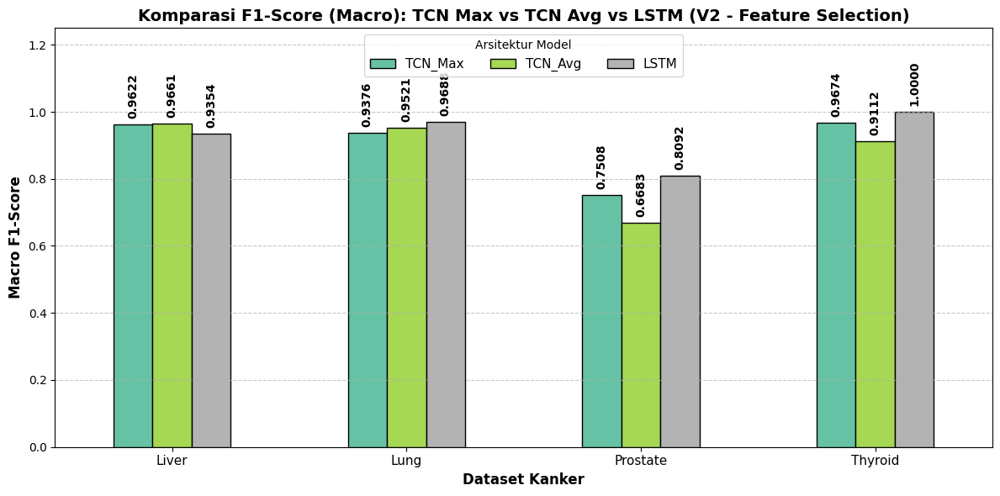

[SUCCESS] Bar plot komparasi V2 tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\f1_score_comparison_v2.png


In [36]:
# ==============================================================================
# 8.1 VISUALISASI KOMPARASI KINERJA MODEL (BAR PLOT F1-SCORE) - V2
# ==============================================================================
import matplotlib.pyplot as plt
import pandas as pd
import os

print("=" * 80)
print("[INFO] Generating Bar Plot Komparasi Macro F1-Score (V2)...")
print("=" * 80)

base_path = WORKING_PATH + "\\"
csv_path = os.path.join(base_path, "final_test_metrics_v2.csv")

# Keamanan: Baca file CSV jika dataframe belum ada di memori
if 'df_eval' not in globals():
    if os.path.exists(csv_path):
        df_eval = pd.read_csv(csv_path)
        print("[INFO] Membaca data evaluasi dari file CSV...")
    else:
        raise FileNotFoundError(f"[ERROR] File {csv_path} tidak ditemukan. Run Part 7 dulu.")

# Pivot table menggunakan 'Macro_F1' dari hasil evaluasi V2
df_f1_pivot = df_eval.pivot_table(index='Dataset', columns='Model', values='Macro_F1', aggfunc='last')

cols_order = ['TCN_Max', 'TCN_Avg', 'LSTM']
df_f1_pivot = df_f1_pivot[[col for col in cols_order if col in df_f1_pivot.columns]]

plt.figure(figsize=(12, 6))
ax = df_f1_pivot.plot(kind='bar', colormap='Set2', edgecolor='black', ax=plt.gca())

plt.title('Komparasi F1-Score (Macro): TCN Max vs TCN Avg vs LSTM (V2 - Feature Selection)', fontsize=14, fontweight='bold')
plt.xlabel('Dataset Kanker', fontsize=12, fontweight='bold')
plt.ylabel('Macro F1-Score', fontsize=12, fontweight='bold')
plt.ylim(0, 1.25) # Space tambahan di atas untuk legend

for p in ax.patches:
    if p.get_height() > 0:
        ax.annotate(format(p.get_height(), '.4f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'bottom', 
                    xytext = (0, 5), 
                    textcoords = 'offset points',
                    fontsize=10, fontweight='bold', rotation=90)

plt.legend(title='Arsitektur Model', fontsize=11, loc='upper center', ncol=3)
plt.xticks(rotation=0, fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plot_path = os.path.join(base_path, "f1_score_comparison_v2.png")
plt.savefig(plot_path, dpi=300)
plt.show()

print(f"[SUCCESS] Bar plot komparasi V2 tersimpan di: {plot_path}")

[INFO] Memulai Generasi Confusion Matrix V2...

[PROSES] Menggambar Confusion Matrix untuk: TCN_Max


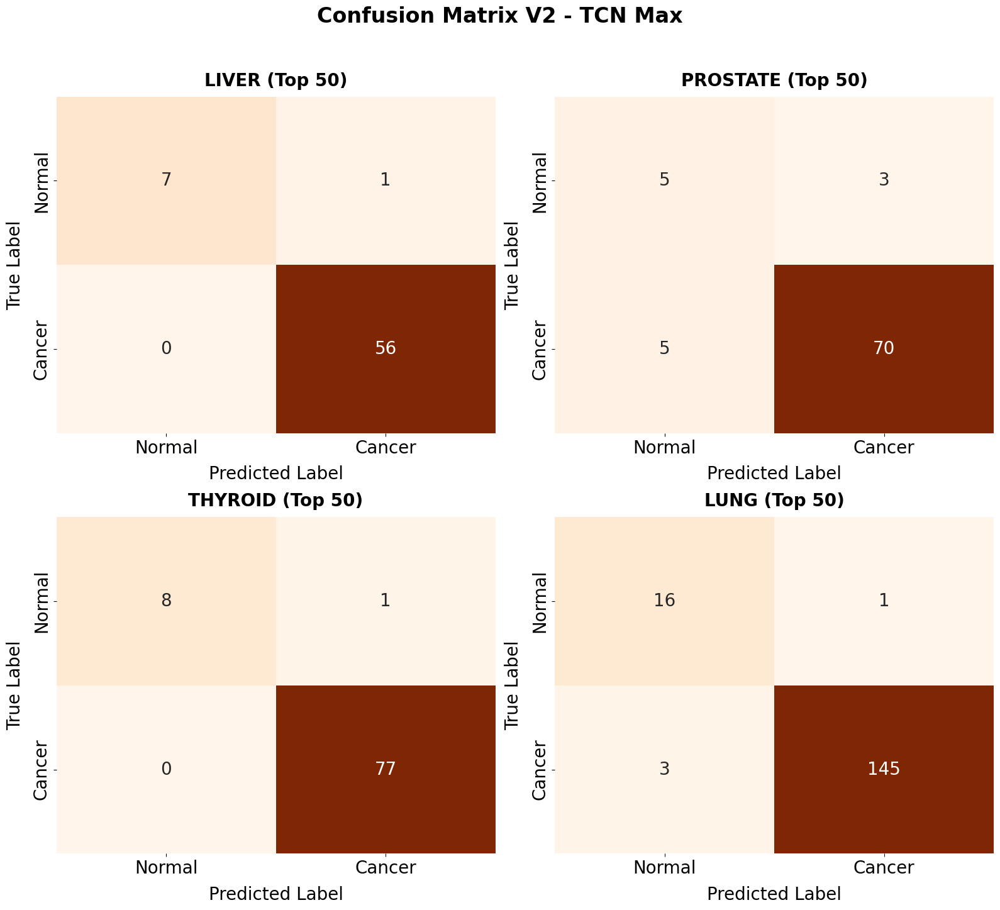


[PROSES] Menggambar Confusion Matrix untuk: TCN_Avg


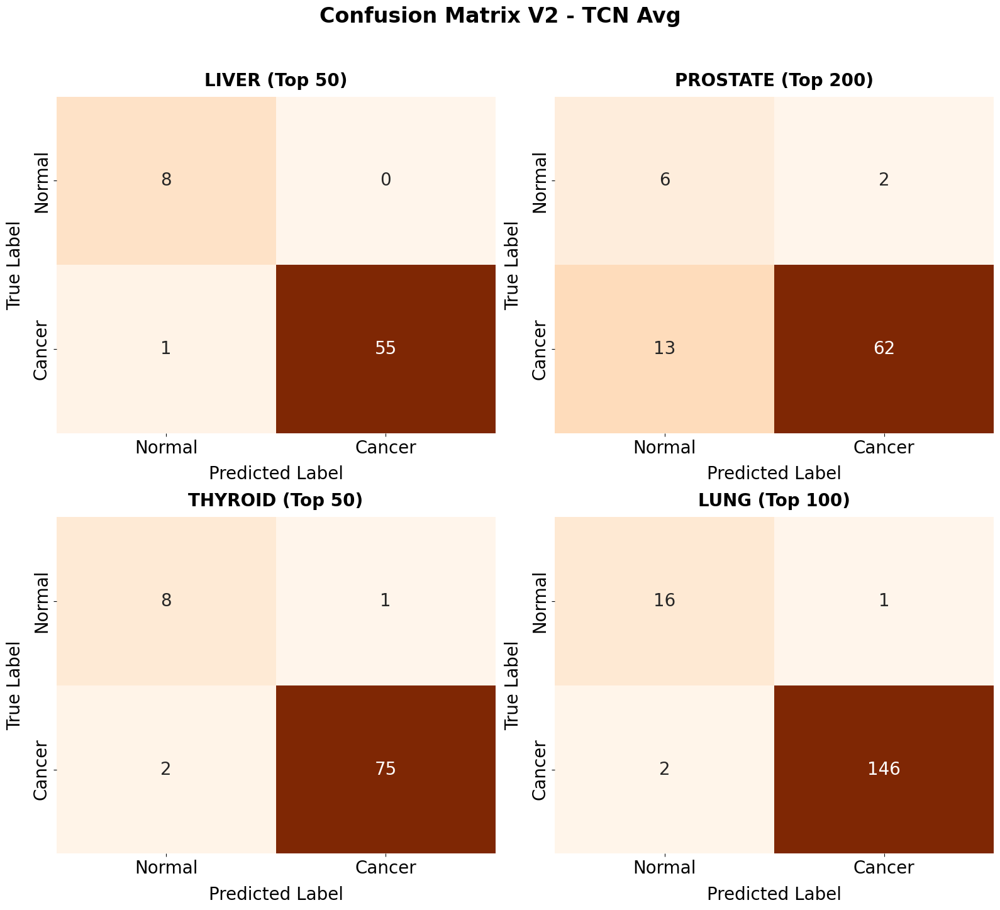


[PROSES] Menggambar Confusion Matrix untuk: LSTM


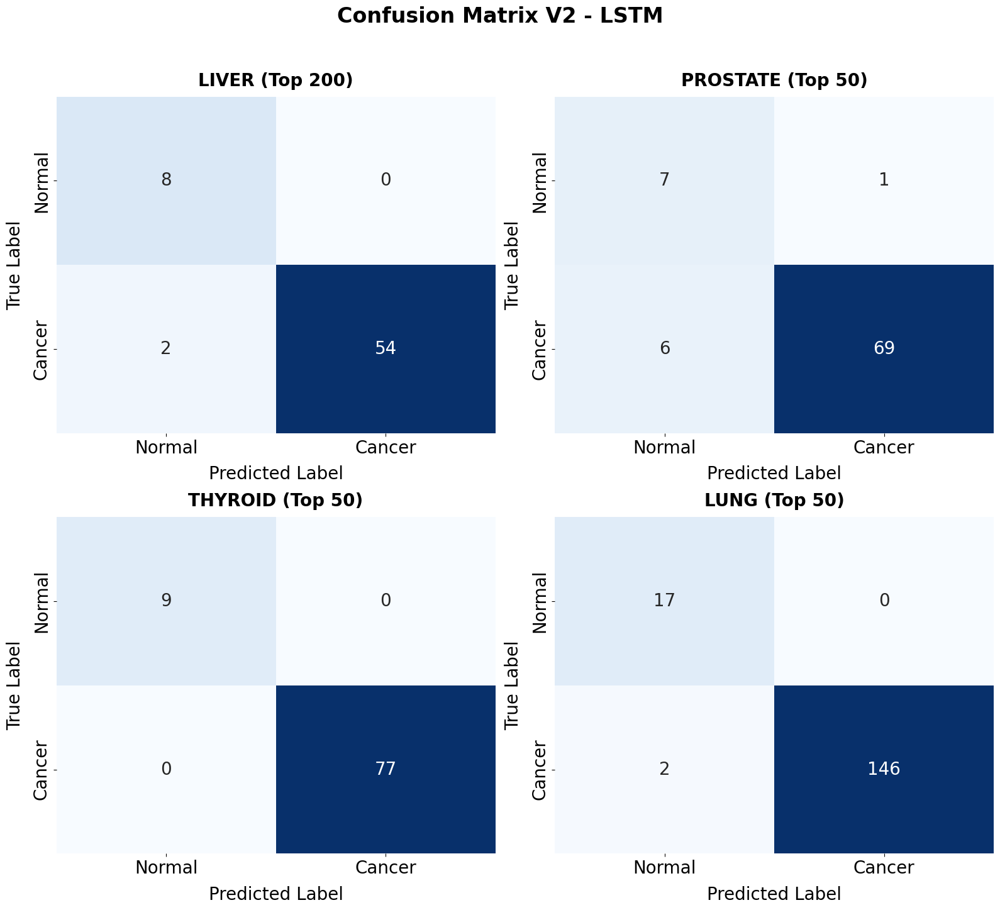


[SUCCESS] Seluruh Confusion Matrix V2 dengan ukuran font 20 berhasil disimpan!


In [6]:
# ==============================================================================
# 8.2 VISUALISASI CONFUSION MATRIX (V2 - FEATURE SELECTION) - FONT UKURAN 20
# ==============================================================================
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os
import gc

print("=" * 80)
print("[INFO] Memulai Generasi Confusion Matrix V2...")
print("=" * 80)

base_path = WORKING_PATH + "\\"
strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
cancer_types = ['Liver', 'Prostate', 'Thyroid', 'Lung']

# Dictionary Config 
tcn_max_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001}
}

lstm_configs = {
    'Liver':    {'features': 200, 'lr': 0.0001, 'units': 16, 'dropout': 0.4},
    'Lung':     {'features': 50,  'lr': 0.0005, 'units': 32, 'dropout': 0.4},
    'Prostate': {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.4},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.5}
}

tcn_avg_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 100, 'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 200, 'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001}
}

models_to_evaluate = [
    ('TCN_Max', build_tcn_model, tcn_max_configs, 'best_tcn_max_{}.weights.h5'),
    ('TCN_Avg', build_tcn_avg_model, tcn_avg_configs, 'best_tcn_avg_{}.weights.h5'),
    ('LSTM', build_lstm_model, lstm_configs, 'best_lstm_{}.weights.h5')
]

for model_name, build_fn, config_dict, weight_pattern in models_to_evaluate:
    print(f"\n[PROSES] Menggambar Confusion Matrix untuk: {model_name}")
    
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 14)) 
    fig.suptitle(f'Confusion Matrix V2 - {model_name.replace("_", " ")}', fontsize=24, fontweight='bold', y=1.03)
    axes = axes.flatten()
    
    for i, cancer in enumerate(cancer_types):
        config = config_dict[cancer]
        k_feat = config['features']
        
        # Load dataset dengan Top K fitur dari path baru yang sudah disesuaikan
        X_test_3d = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
        y_test = np.load(os.path.join(base_path, f"{cancer}_y_test.npy")).astype(int)
        
        reset_random_seeds(42) 
        
        if model_name == 'LSTM':
            model = build_fn(
                (X_test_3d.shape[1], 1), strategy, 
                learning_rate=config['lr'], lstm_units=config['units'], dropout_rate=config['dropout']
            )
        else:
            model = build_fn(
                (X_test_3d.shape[1], 1), strategy, 
                learning_rate=config['lr'], dropout_rate=config['dropout'], l2_rate=config['l2']
            )
            
        weight_file = os.path.join(base_path, weight_pattern.format(cancer))
        if os.path.exists(weight_file):
            model.load_weights(weight_file)
            
            #  batch_size untuk keamanan VRAM laptop
            y_pred_prob = model.predict(X_test_3d, batch_size=16, verbose=0)
            y_pred = (y_pred_prob > 0.5).astype(int).flatten()
            
            cm = confusion_matrix(y_test, y_pred)
            
            
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues' if 'LSTM' in model_name else 'Oranges', 
                        ax=axes[i], cbar=False, 
                        xticklabels=['Normal', 'Cancer'], yticklabels=['Normal', 'Cancer'],
                        annot_kws={"size": 20}) 
            
            # Set ukuran 
            axes[i].set_title(f'{cancer.upper()} (Top {k_feat})', fontsize=20, fontweight='bold', pad=12)
            axes[i].set_ylabel('True Label', fontsize=20, labelpad=10)
            axes[i].set_xlabel('Predicted Label', fontsize=20, labelpad=10)
            axes[i].tick_params(axis='both', which='major', labelsize=20)
        else:
            axes[i].set_title(f'{cancer.upper()} (Bobot Tidak Ditemukan)', fontsize=20)
            axes[i].axis('off')

        del X_test_3d, y_test, model
        try: del y_pred_prob, y_pred
        except: pass
        tf.keras.backend.clear_session()
        gc.collect()

    plt.tight_layout()
    plot_path = os.path.join(base_path, f"confusion_matrix_{model_name.lower()}_v2.png")
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    plt.show()

print("\n[SUCCESS] Seluruh Confusion Matrix V2 dengan ukuran font 20 berhasil disimpan!")

In [38]:
# ==============================================================================
# PART 9: INTERPRETABILITAS MENGGUNAKAN SHAP (V2 - FEATURE SELECTION)
# ==============================================================================
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import gc

print("="*80)
print("[INFO] Memulai Ekstraksi SHAP (V2 - Resolusi Tinggi)")
print("[INFO] Mengeksekusi dengan nsamples=1000 pada data hasil Feature Selection.")
print("="*80)

base_path = WORKING_PATH + "\\"
strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
cancer_types = ['Liver', 'Prostate', 'Thyroid', 'Lung']

# Fungsi Wrapper Safe (Anti-OOM) dengan batch_size=16
def make_predict_fn(model):
    def predict_fn(x_2d):
        x_3d = np.expand_dims(x_2d, axis=-1)
        return model.predict(x_3d, batch_size=16, verbose=0).flatten()
    return predict_fn

[INFO] Memulai Ekstraksi SHAP (V2 - Resolusi Tinggi)
[INFO] Mengeksekusi dengan nsamples=1000 pada data hasil Feature Selection.



[PROSES] 9.1 SHAP TCN ORIGINAL (MAX POOLING)

 -> Ekstraksi SHAP TCN Max untuk: LIVER (Top 50 Fitur)


  0%|          | 0/64 [00:00<?, ?it/s]

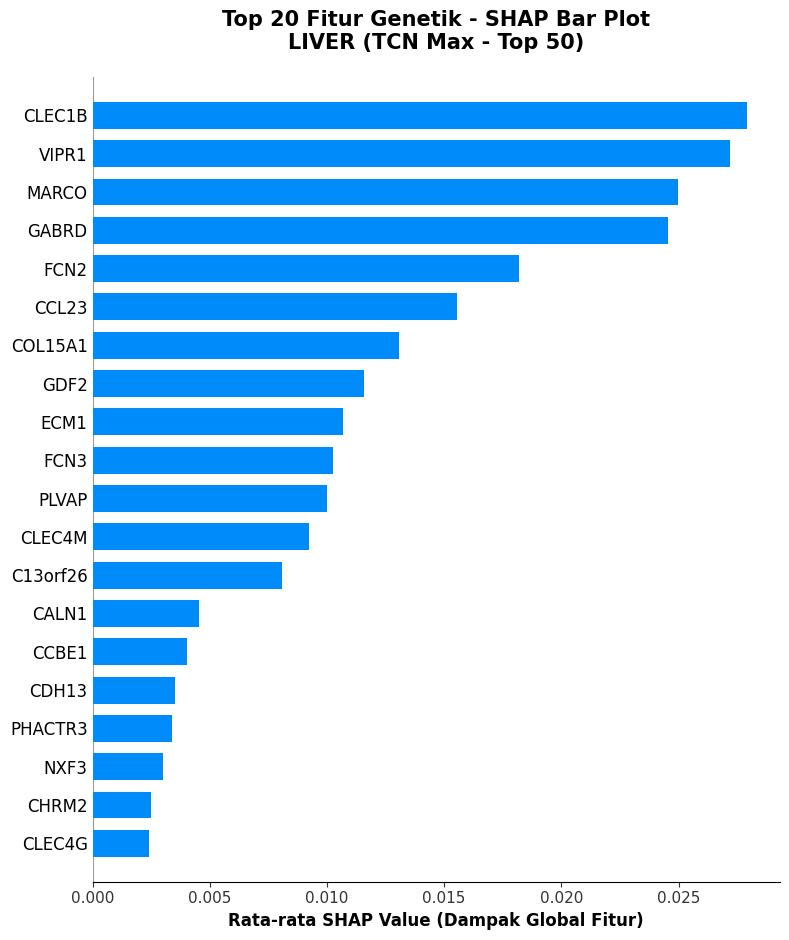

    [Selesai] Grafik Bar tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_max_Liver_v2.png

 -> Ekstraksi SHAP TCN Max untuk: PROSTATE (Top 50 Fitur)


  0%|          | 0/83 [00:00<?, ?it/s]

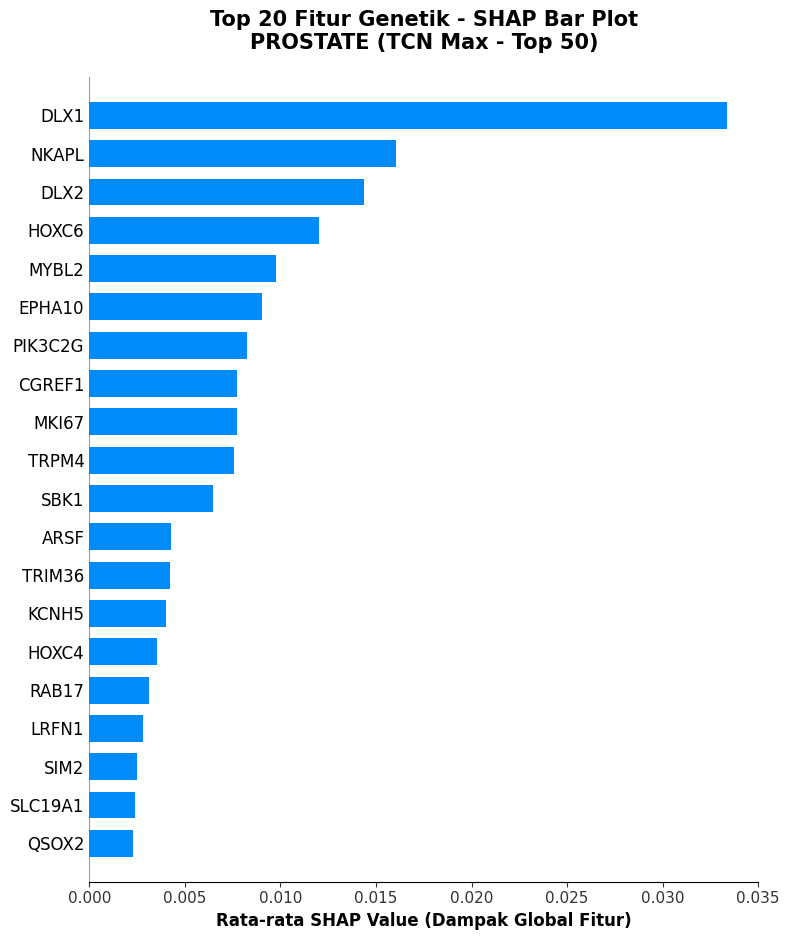

    [Selesai] Grafik Bar tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_max_Prostate_v2.png

 -> Ekstraksi SHAP TCN Max untuk: THYROID (Top 50 Fitur)


  0%|          | 0/86 [00:00<?, ?it/s]

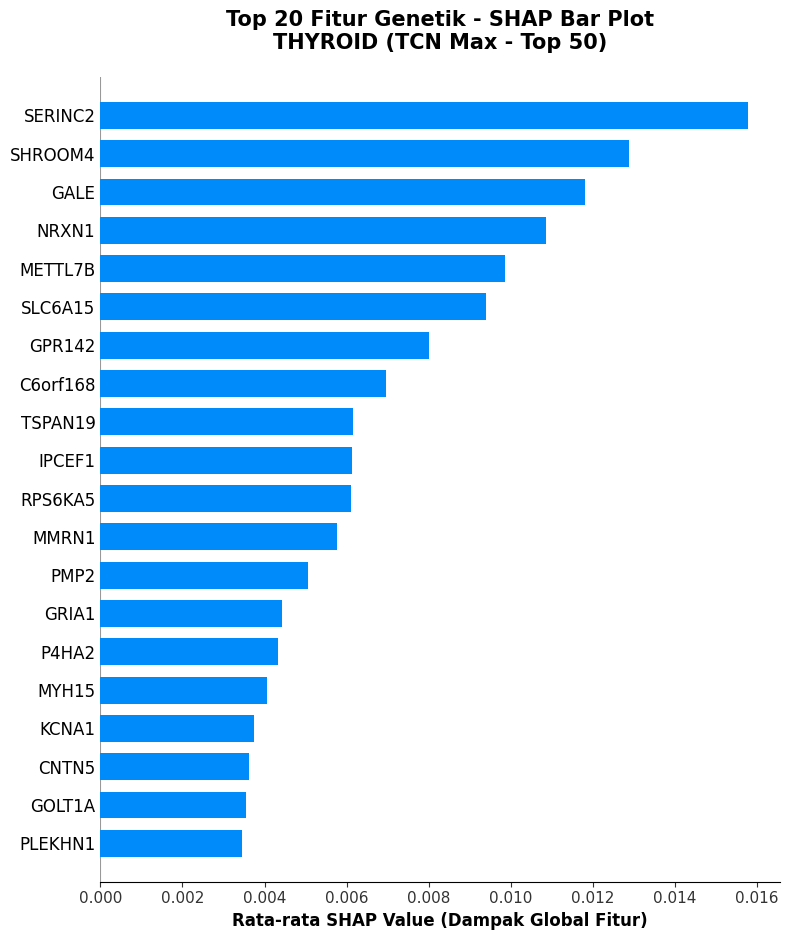

    [Selesai] Grafik Bar tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_max_Thyroid_v2.png

 -> Ekstraksi SHAP TCN Max untuk: LUNG (Top 50 Fitur)


  0%|          | 0/100 [00:00<?, ?it/s]

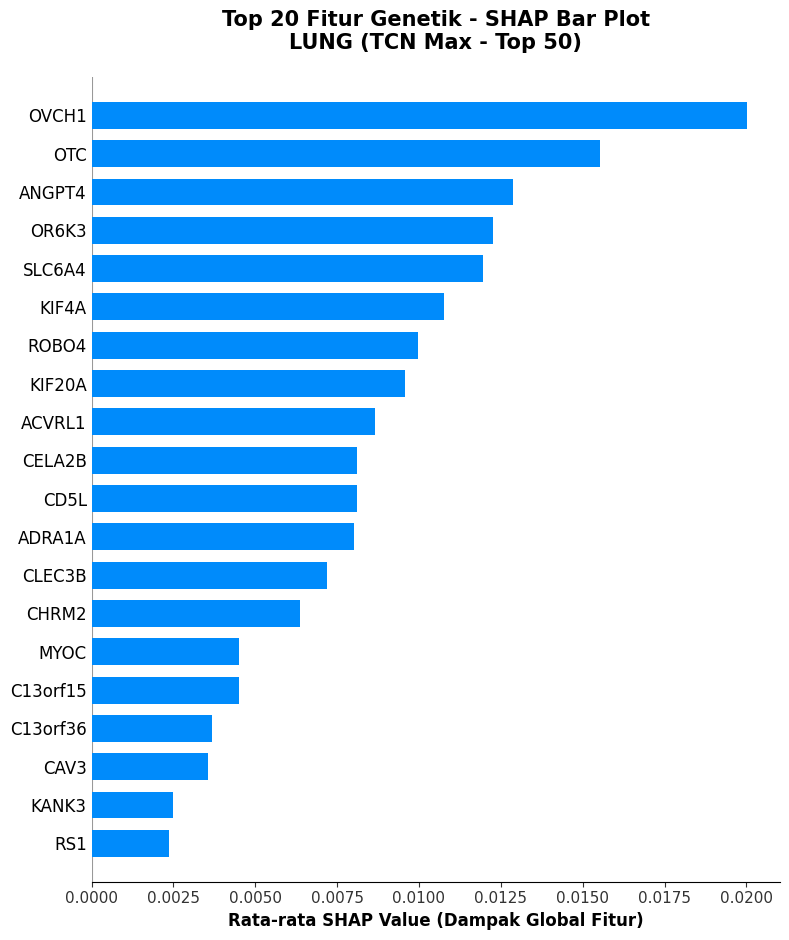

    [Selesai] Grafik Bar tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_max_Lung_v2.png


In [39]:
# ------------------------------------------------------------------------------
# 9.1 SHAP TCN ORIGINAL (MAX POOLING) -> BAR PLOT
# ------------------------------------------------------------------------------
print("\n[PROSES] 9.1 SHAP TCN ORIGINAL (MAX POOLING)")

tcn_max_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001}
}

for cancer in cancer_types:
    config = tcn_max_configs[cancer]
    k_feat = config['features']
    print(f"\n -> Ekstraksi SHAP TCN Max untuk: {cancer.upper()} (Top {k_feat} Fitur)")
    
    gene_names = np.load(os.path.join(base_path, f"{cancer}_top{k_feat}_genes.npy"), allow_pickle=True).tolist()
    X_train_3d = np.load(os.path.join(base_path, f"{cancer}_X_train_top{k_feat}.npy"))
    X_test_3d  = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    
    reset_random_seeds(42)
    bg_idx = np.random.choice(X_train_3d.shape[0], min(50, X_train_3d.shape[0]), replace=False)
    test_idx = np.random.choice(X_test_3d.shape[0], min(100, X_test_3d.shape[0]), replace=False)
    
    background_data_2d = X_train_3d[bg_idx, :, 0]
    test_data_2d = X_test_3d[test_idx, :, 0]
    
    reset_random_seeds(42)
    model = build_tcn_model((X_train_3d.shape[1], 1), strategy, config['lr'], config['dropout'], config['l2'])
    weight_file = os.path.join(base_path, f"best_tcn_max_{cancer}.weights.h5")
    
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        
        background_summary = shap.kmeans(background_data_2d, 5) 
        explainer = shap.KernelExplainer(make_predict_fn(model), background_summary)
        
        # Eksekusi SHAP (Sangat cepat karena fitur sedikit)
        shap_values = explainer.shap_values(test_data_2d, nsamples=1000)
        shap_vals_2d = shap_values[0] if isinstance(shap_values, list) else shap_values
        df_test_features = pd.DataFrame(test_data_2d, columns=gene_names)

        plt.figure(figsize=(10, 8))
        plt.clf() 
        
        shap.summary_plot(shap_vals_2d, df_test_features, feature_names=gene_names, max_display=20, plot_type="bar", show=False)
        
        fig = plt.gcf(); ax = plt.gca()
        ax.tick_params(axis='y', labelsize=12, labelcolor='black', length=0)
        plt.xlabel("Rata-rata SHAP Value (Dampak Global Fitur)", fontsize=12, fontweight='bold')
        plt.title(f"Top 20 Fitur Genetik - SHAP Bar Plot\n{cancer.upper()} (TCN Max - Top {k_feat})", fontsize=15, fontweight='bold', pad=20)
        plt.tight_layout()
        
        plot_path = os.path.join(base_path, f"shap_tcn_max_{cancer}_v2.png")
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"    [Selesai] Grafik Bar tersimpan di: {plot_path}")
    else:
        print(f"    [SKIP] Bobot model {weight_file} tidak ditemukan.")
        
    del model, X_train_3d, X_test_3d; tf.keras.backend.clear_session(); gc.collect()


[PROSES] 9.2 SHAP TCN EKSPERIMEN (AVERAGE POOLING)

 -> Ekstraksi SHAP TCN Avg untuk: LIVER (Top 50 Fitur)


  0%|          | 0/64 [00:00<?, ?it/s]

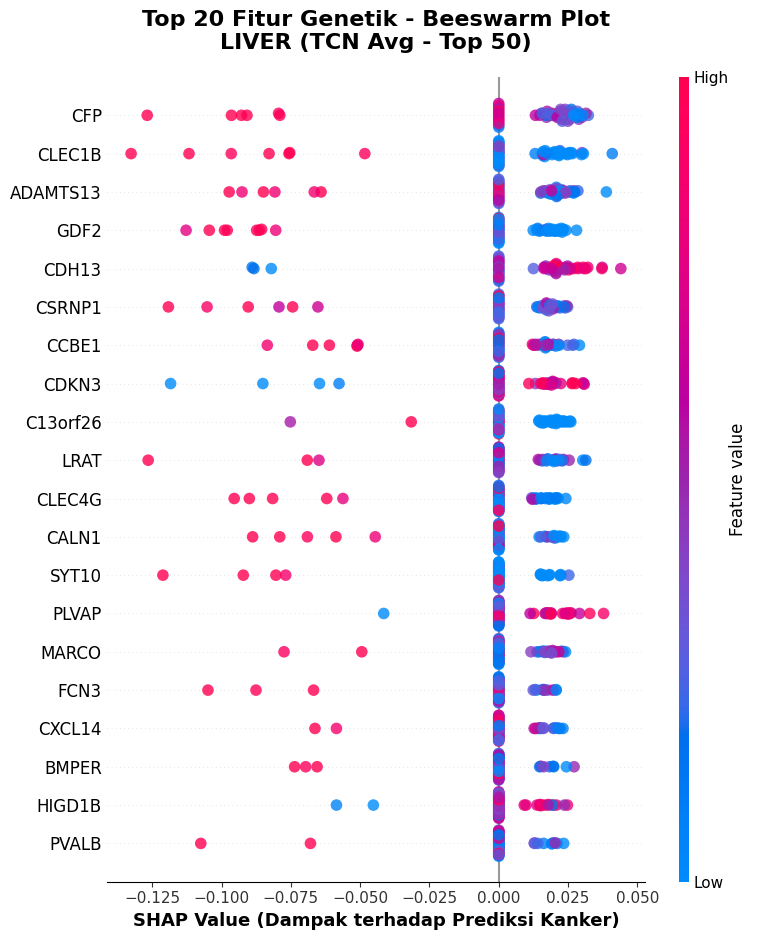

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_avg_Liver_v2.png

 -> Ekstraksi SHAP TCN Avg untuk: PROSTATE (Top 200 Fitur)


  0%|          | 0/83 [00:00<?, ?it/s]

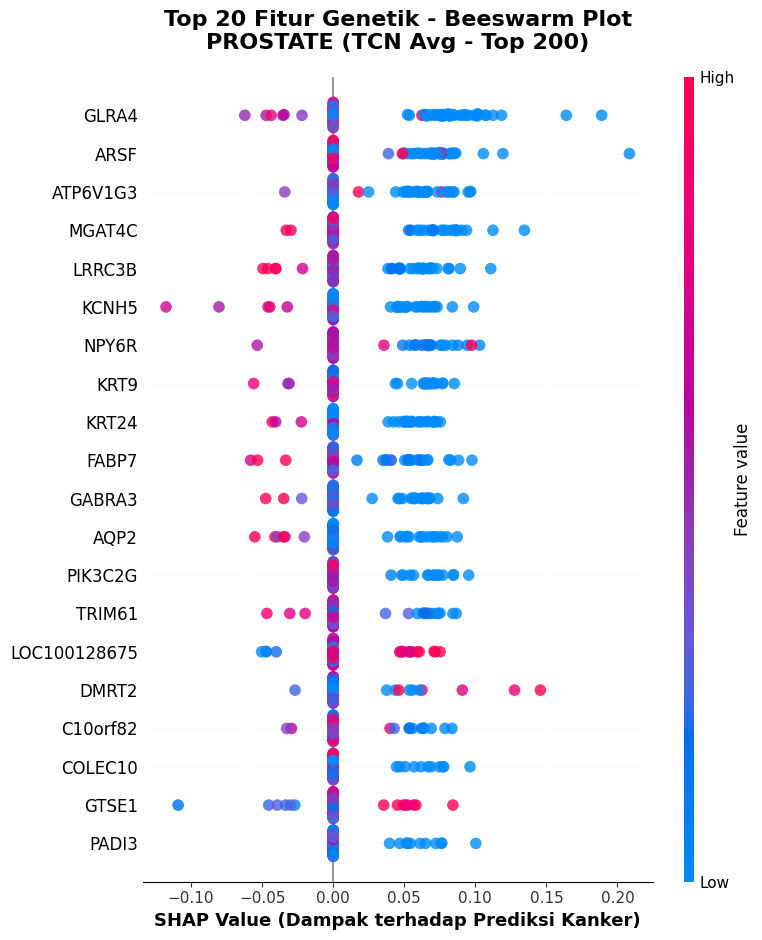

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_avg_Prostate_v2.png

 -> Ekstraksi SHAP TCN Avg untuk: THYROID (Top 50 Fitur)


  0%|          | 0/86 [00:00<?, ?it/s]

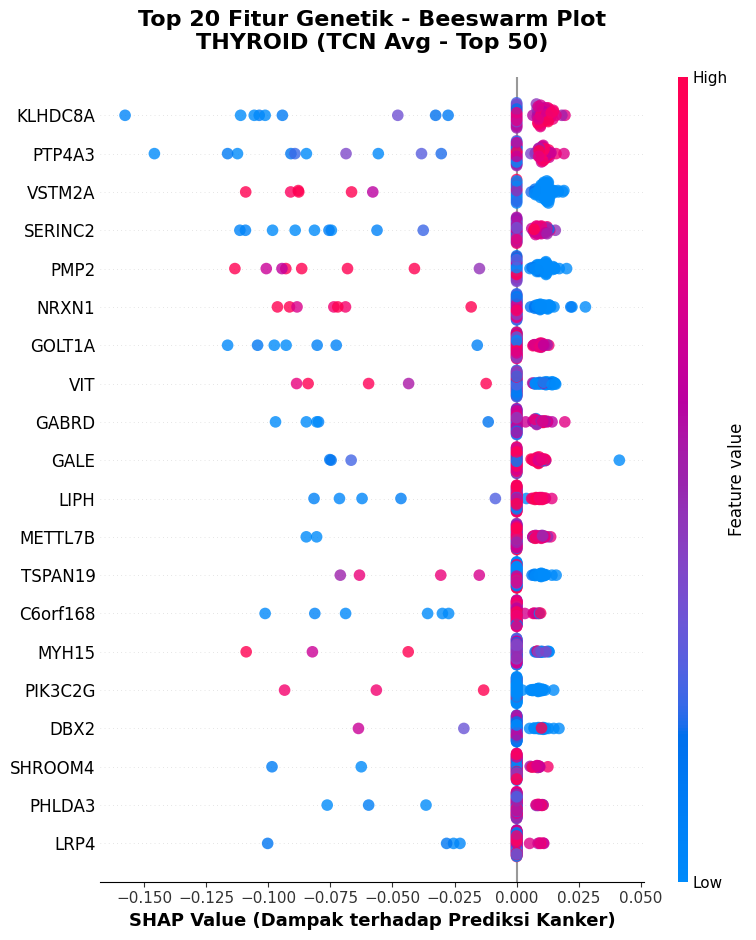

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_avg_Thyroid_v2.png

 -> Ekstraksi SHAP TCN Avg untuk: LUNG (Top 100 Fitur)


  0%|          | 0/100 [00:00<?, ?it/s]

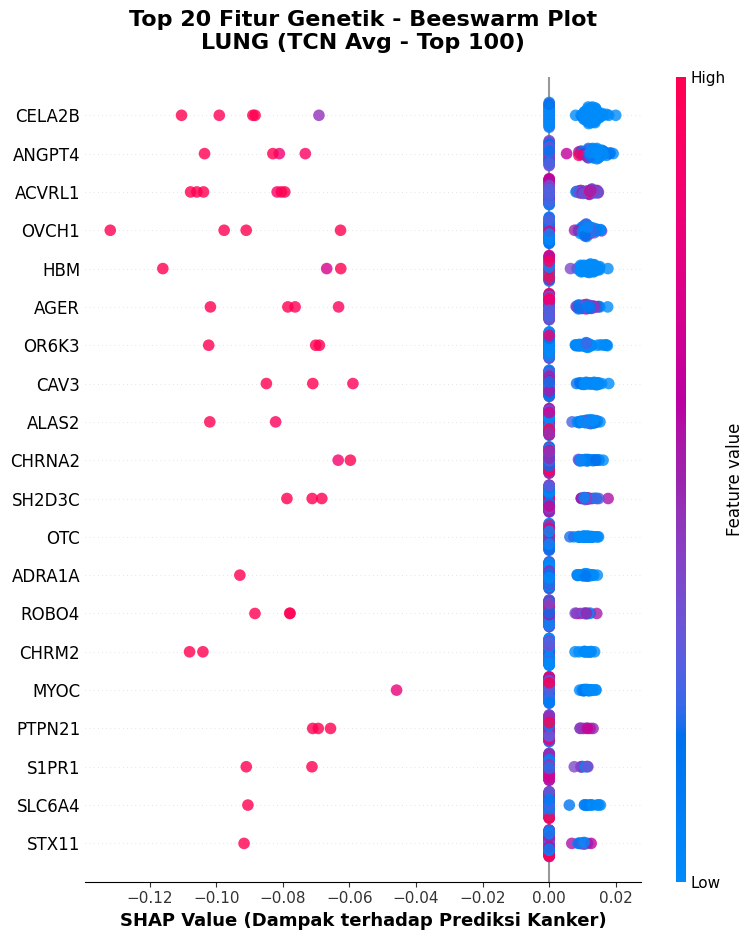

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_tcn_avg_Lung_v2.png


In [40]:
# ------------------------------------------------------------------------------
# 9.2 SHAP TCN EKSPERIMEN (AVERAGE POOLING) -> HIGH-DENSITY BEESWARM PLOT
# ------------------------------------------------------------------------------
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import gc

print("\n" + "="*80)
print("[PROSES] 9.2 SHAP TCN EKSPERIMEN (AVERAGE POOLING)")
print("="*80)

tcn_avg_configs = {
    'Liver':    {'features': 50,  'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Lung':     {'features': 100, 'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001},
    'Prostate': {'features': 200, 'lr': 0.001,  'dropout': 0.1, 'l2': 0.00001},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'dropout': 0.1, 'l2': 0.00001}
}

for cancer in cancer_types:
    config = tcn_avg_configs[cancer]
    k_feat = config['features']
    print(f"\n -> Ekstraksi SHAP TCN Avg untuk: {cancer.upper()} (Top {k_feat} Fitur)")
    
    gene_names = np.load(os.path.join(base_path, f"{cancer}_top{k_feat}_genes.npy"), allow_pickle=True).tolist()
    X_train_3d = np.load(os.path.join(base_path, f"{cancer}_X_train_top{k_feat}.npy"))
    X_test_3d  = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    
    reset_random_seeds(42)
    bg_idx = np.random.choice(X_train_3d.shape[0], min(50, X_train_3d.shape[0]), replace=False)
    test_idx = np.random.choice(X_test_3d.shape[0], min(100, X_test_3d.shape[0]), replace=False)
    
    background_data_2d = X_train_3d[bg_idx, :, 0]
    test_data_2d = X_test_3d[test_idx, :, 0]
    
    reset_random_seeds(42)
    model = build_tcn_avg_model((X_train_3d.shape[1], 1), strategy, config['lr'], config['dropout'], config['l2'])
    weight_file = os.path.join(base_path, f"best_tcn_avg_{cancer}.weights.h5")
    
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        
        background_summary = shap.kmeans(background_data_2d, 5) 
        explainer = shap.KernelExplainer(make_predict_fn(model), background_summary)
        
        shap_values = explainer.shap_values(test_data_2d, nsamples=1000)
        shap_vals_2d = shap_values[0] if isinstance(shap_values, list) else shap_values
        df_test_features = pd.DataFrame(test_data_2d, columns=gene_names)

        plt.figure(figsize=(11, 8))
        plt.clf() 
        
        shap.summary_plot(shap_vals_2d, df_test_features, feature_names=gene_names, max_display=20, show=False, alpha=0.8)
        
        ax = plt.gca()
        for collection in ax.collections:
            collection.set_sizes([70]) # Ukuran titik lebih besar ala Jurnal
            
        ax.tick_params(axis='y', labelsize=12, labelcolor='black', length=0)
        ax.tick_params(axis='x', labelsize=11)
        plt.xlabel("SHAP Value (Dampak terhadap Prediksi Kanker)", fontsize=13, fontweight='bold')
        plt.title(f"Top 20 Fitur Genetik - Beeswarm Plot\n{cancer.upper()} (TCN Avg - Top {k_feat})", fontsize=16, fontweight='bold', pad=20)
        plt.tight_layout()
        
        plot_path = os.path.join(base_path, f"shap_tcn_avg_{cancer}_v2.png")
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"    [Selesai] Grafik Beeswarm tersimpan di: {plot_path}")
    else:
        print(f"    [SKIP] Bobot model {weight_file} tidak ditemukan.")
        
    del model, X_train_3d, X_test_3d; tf.keras.backend.clear_session(); gc.collect()


[PROSES] 9.3 SHAP LSTM ORIGINAL

 -> Ekstraksi SHAP LSTM untuk: LIVER (Top 200 Fitur)


  0%|          | 0/64 [00:00<?, ?it/s]

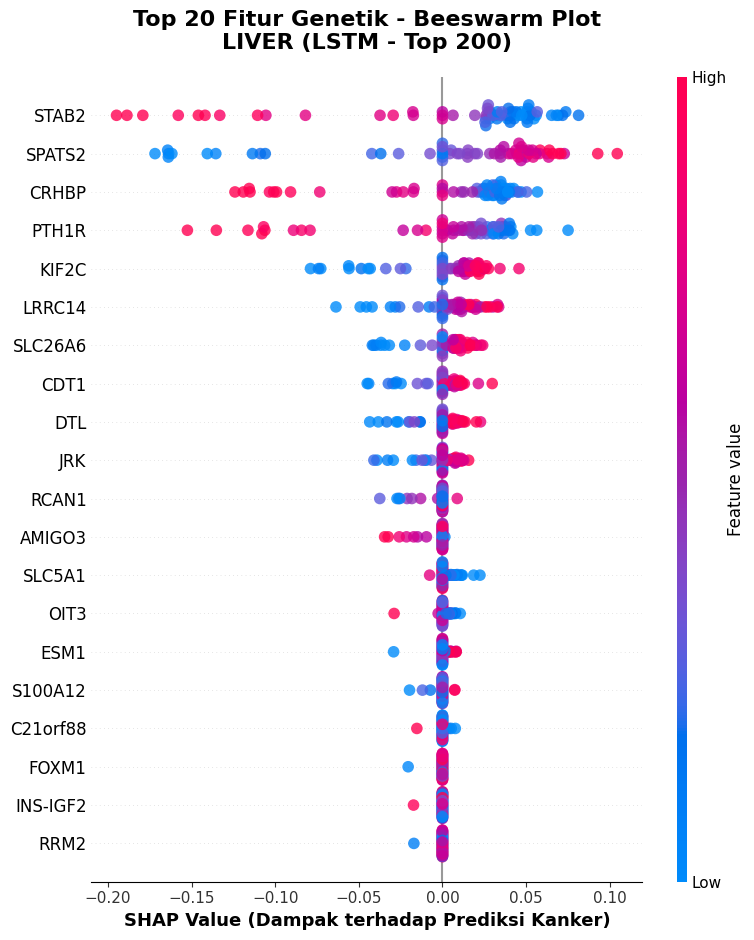

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_lstm_Liver_v2.png

 -> Ekstraksi SHAP LSTM untuk: PROSTATE (Top 50 Fitur)


  0%|          | 0/83 [00:00<?, ?it/s]

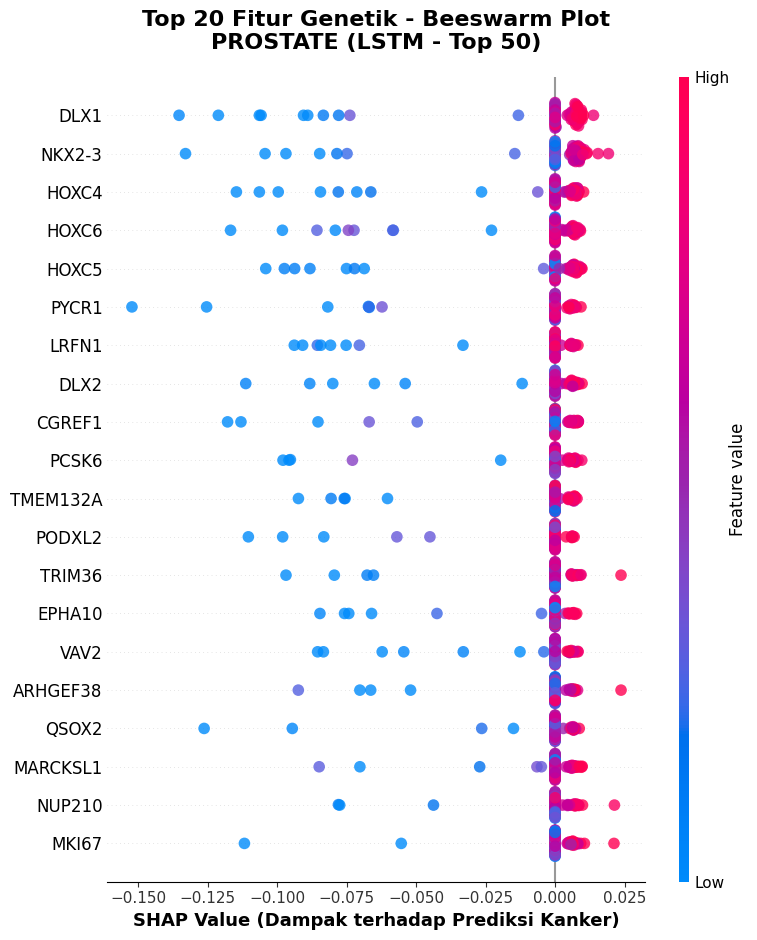

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_lstm_Prostate_v2.png

 -> Ekstraksi SHAP LSTM untuk: THYROID (Top 50 Fitur)


  0%|          | 0/86 [00:00<?, ?it/s]

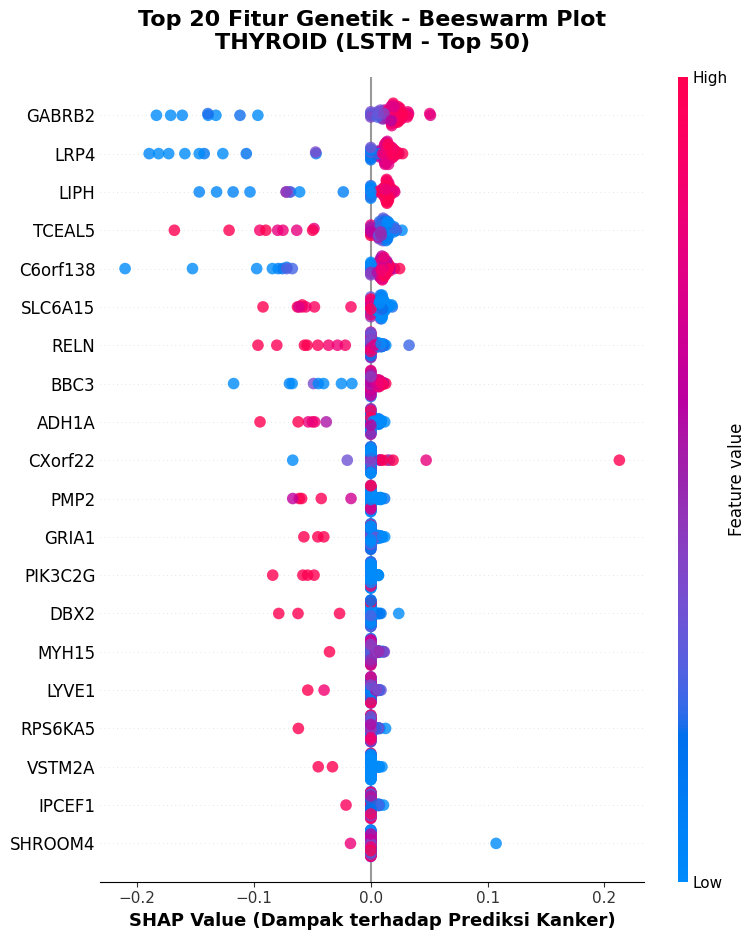

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_lstm_Thyroid_v2.png

 -> Ekstraksi SHAP LSTM untuk: LUNG (Top 50 Fitur)


  0%|          | 0/100 [00:00<?, ?it/s]

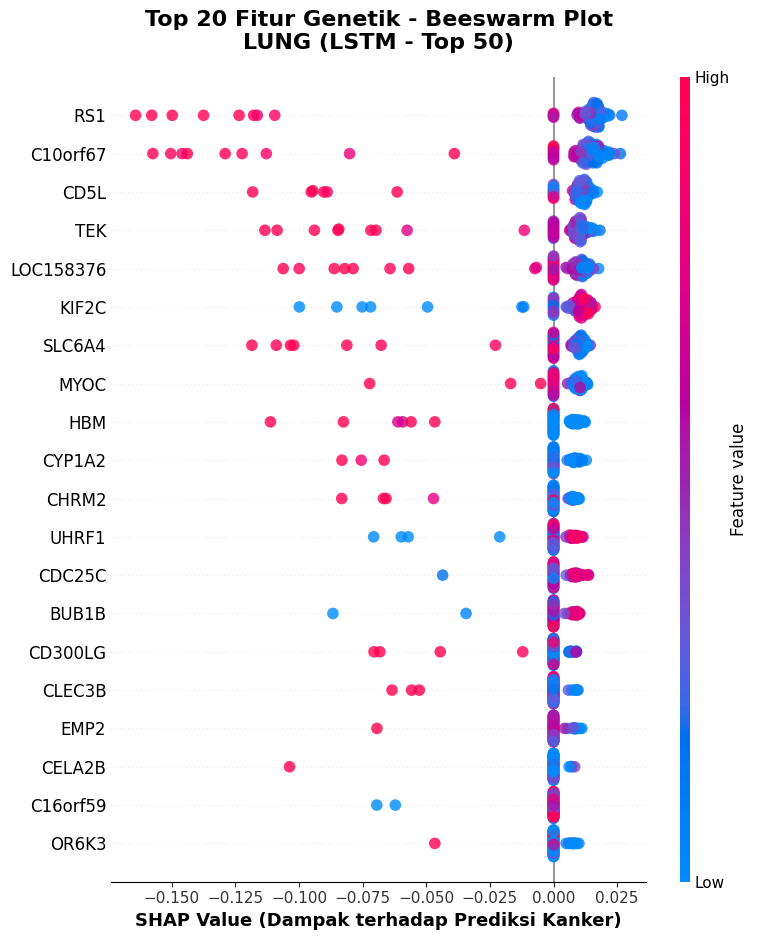

    [Selesai] Grafik Beeswarm tersimpan di: C:\Users\DELL\OneDrive\Documents\TA\Dedicated GPU test laptop\V2 SMOTE tcn-dan-lstm-klasifikasi-kanker\Output\shap_lstm_Lung_v2.png

[INFO] SELURUH ANALISIS SHAP V2 SELESAI!


In [41]:
# ------------------------------------------------------------------------------
# 9.3 SHAP LSTM ORIGINAL -> HIGH-DENSITY BEESWARM PLOT
# ------------------------------------------------------------------------------
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import gc

print("\n" + "="*80)
print("[PROSES] 9.3 SHAP LSTM ORIGINAL")
print("="*80)

lstm_configs = {
    'Liver':    {'features': 200, 'lr': 0.0001, 'units': 16, 'dropout': 0.4},
    'Lung':     {'features': 50,  'lr': 0.0005, 'units': 32, 'dropout': 0.4},
    'Prostate': {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.4},
    'Thyroid':  {'features': 50,  'lr': 0.0005, 'units': 16, 'dropout': 0.5}
}

for cancer in cancer_types:
    config = lstm_configs[cancer]
    k_feat = config['features']
    print(f"\n -> Ekstraksi SHAP LSTM untuk: {cancer.upper()} (Top {k_feat} Fitur)")
    
    gene_names = np.load(os.path.join(base_path, f"{cancer}_top{k_feat}_genes.npy"), allow_pickle=True).tolist()
    X_train_3d = np.load(os.path.join(base_path, f"{cancer}_X_train_top{k_feat}.npy"))
    X_test_3d  = np.load(os.path.join(base_path, f"{cancer}_X_test_top{k_feat}.npy"))
    
    reset_random_seeds(42)
    bg_idx = np.random.choice(X_train_3d.shape[0], min(50, X_train_3d.shape[0]), replace=False)
    test_idx = np.random.choice(X_test_3d.shape[0], min(100, X_test_3d.shape[0]), replace=False)
    
    background_data_2d = X_train_3d[bg_idx, :, 0]
    test_data_2d = X_test_3d[test_idx, :, 0]
    
    reset_random_seeds(42)
    model = build_lstm_model((X_train_3d.shape[1], 1), strategy, config['lr'], config['units'], config['dropout'])
    weight_file = os.path.join(base_path, f"best_lstm_{cancer}.weights.h5")
    
    if os.path.exists(weight_file):
        model.load_weights(weight_file)
        
        background_summary = shap.kmeans(background_data_2d, 5) 
        explainer = shap.KernelExplainer(make_predict_fn(model), background_summary)
        
        shap_values = explainer.shap_values(test_data_2d, nsamples=1000)
        shap_vals_2d = shap_values[0] if isinstance(shap_values, list) else shap_values
        df_test_features = pd.DataFrame(test_data_2d, columns=gene_names)
        
        plt.figure(figsize=(11, 8))
        plt.clf() 
        
        shap.summary_plot(shap_vals_2d, df_test_features, feature_names=gene_names, max_display=20, show=False, alpha=0.8)
        
        ax = plt.gca()
        for collection in ax.collections:
            collection.set_sizes([70]) 
            
        ax.tick_params(axis='y', labelsize=12, labelcolor='black', length=0) 
        ax.tick_params(axis='x', labelsize=11)
        plt.xlabel("SHAP Value (Dampak terhadap Prediksi Kanker)", fontsize=13, fontweight='bold')
        plt.title(f"Top 20 Fitur Genetik - Beeswarm Plot\n{cancer.upper()} (LSTM - Top {k_feat})", fontsize=16, fontweight='bold', pad=20)
        plt.tight_layout()
        
        plot_path = os.path.join(base_path, f"shap_lstm_{cancer}_v2.png")
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"    [Selesai] Grafik Beeswarm tersimpan di: {plot_path}")
    else:
        print(f"    [SKIP] Bobot model {weight_file} tidak ditemukan.")
        
    del model, X_train_3d, X_test_3d; tf.keras.backend.clear_session(); gc.collect()

print("\n" + "="*80)
print("[INFO] SELURUH ANALISIS SHAP V2 SELESAI!")
print("="*80)